<h1><center> Machine Learning II - Credit Default Prediction </center></h1>

<center> Authors : Florian Abeillon & Jean-Peïc Chou </center>


 <center> ________________________________________________________ </center>
 
 

# Table of contents

Definition of problem

Importing the libraries

<span style="color:blue"> 1. Prepating Dataset </span>
<br/> 1.1. Removing NaN values
<br/> 1.2. Formatting data
<br/> 1.3. Creating relative (and not absolute) features
<br/> 1.4. Encoding data
<br/> 1.5. Displaying preprocessed dataset

<span style="color:blue"> 2. Analyszing data </span>
<br/> 2.1. Plotting all features
<br/> 2.2. Checking anomalies
<br/> <span style="color:gray"> 2.2.1. Useful functions </span>
<br/> <span style="color:gray"> 2.2.2. Number_Of_Dependant </span>
<br/> <span style="color:gray"> 2.2.3. Net_Annual_Income </span>
<br/> <span style="color:gray"> 2.2.4. Years_At_Business </span>
<br/> <span style="color:gray"> 2.2.5. Senority </span>
<br/> <span style="color:gray"> 2.2.6. Dropping anomalies </span>
<br/> <span style="color:gray"> 2.2.7. Checking and cleaning data </span>
<br/> <span style="color:#999999"> 2.2.7.1. Customer_Type / Senority </span>
<br/> <span style="color:#999999"> 2.2.7.2. Age / Seniority </span>
<br/> <span style="color:#999999"> 2.2.7.3. Age / Years_At_Business </span>
<br/> <span style="color:#999999"> 2.2.7.4. Age / Years_At_Residence </span>
<br/> 2.3. Correlations
<br/> <span style="color:gray"> 2.3.1. Correlations with Y </span>
<br/> <span style="color:gray"> 2.3.2. Correlations between features </span>
<br/> <span style="color:gray"> 2.3.3. Computing correlations given a Prod_Category </span>
<br/> 2.4. Constructing new features & Determining profiles
<br/> <span style="color:gray"> 2.4.1. Classifying profiles </span>
<br/> <span style="color:#999999"> 2.4.1.1. K-means Clustering </span>
<br/> <span style="color:#999999"> 2.4.1.2. Spectral Clustering </span>
<br/> <span style="color:gray"> 2.4.2. Guessed features </span>
<br/> <span style="color:gray"> 2.4.3. Polynoms of features </span>

<span style="color:blue"> 3. Training models </span>
<br/> 3.1. Logistic regression
<br/> <span style="color:gray"> 3.1.1. 20-Fold Cross Validation on Original Dataset </span>
<br/> <span style="color:gray"> 3.1.2. 20-Fold Cross Validation on Dataset with Polynomial Features </span>
<br/> 3.2. Random Forests
<br/> <span style="color:gray"> 3.2.1. 20-Fold Cross Validation on Original Dataset </span>
<br/> <span style="color:gray"> 3.2.2. 20-Fold Cross Validation on Dataset with Polynomial Features </span>
<br/> 3.3. LGB
<br/> <span style="color:gray"> 3.3.1. 20-Fold Cross Va1.lidation on Original Dataset </span>
<br/> <span style="color:gray"> 3.3.2 20-Fold Cross Validation on Dataset with Polynomial Features </span>
<br/> 3.4. XGBoost
<br/> <span style="color:gray"> 3.4.1. 20-Fold Cross Validation on Original Dataset </span>
<br/> <span style="color:gray"> 3.4.2. 20-Fold Cross Validation on Dataset with Polynomial Features </span>
<br/> 3.5. Support Vector Machine
<br/> <span style="color:gray"> 3.5.1. 20-Fold Cross Validation on Original Dataset </span>
<br/> <span style="color:gray"> 3.5.2. 20-Fold Cross Validation on Dataset with Polynomial Features </span>
<br/> 3.6. Neural Network
<br/> 3.7. Tuning Hyperparameters

<span style="color:blue"> 4. Results & Conclusion </span>


## Definition of the Problem

As the challenge doesn't define the problem thoroughly, we first propose our interpretation to give a **context to the problem**.

The main objective of the challenge is to determine from some clients' data which of them succeed in reapying their credit (Y = 0) or not (Y = 1). 

We considered **real scenario's cases**:
- The bank has granted credits to its clients. N_days after the bank granted them, it wants to determine which clients will successfully repay.
- A client asks the bank for a credit. The bank wants to determine if it's worth accepting his/her request.

As the dataset only gives information about **current clients**, it already present a biasis (the mean annual income of the clients is way higher than the national mean, and they almost all have high diplomas for instance). The second scenario can therefore not be considered. In the next sections, we will interprete the features according to the **first scenario**.

**NB** : We rapidly noted that some information in the dataset almost directly give the answer (**leak**): The feature *Prod_Closed_Date* is not filled out for clients that are still repaying. If their case has not been closed yet, it means that they have not met any problem for the moment (Y = 0). That's why we deleted all rows without *Prod_Closed_Date*.

By doing so, we obtained over 30% of clients presenting a credit default - which seems oddly high in a real context. 

### Importing libraries

In [1]:
# Global tools
import datetime
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from statistics import mean
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, PolynomialFeatures, MinMaxScaler

# Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

import lightgbm as lgb
import xgboost as xgb

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

# Clustering
from sklearn.cluster import KMeans
from sklearn.neighbors import kneighbors_graph
from sklearn.cluster import SpectralClustering

# Scoring metrics
import sklearn.metrics as metrics
from sklearn.metrics import f1_score, precision_score, accuracy_score, recall_score, roc_auc_score

# Cross Validation
from sklearn.model_selection import LeaveOneOut, KFold

# Hyperparameters tuning
from ax.plot.contour import plot_contour
from ax.plot.trace import optimization_trace_single_method
from ax.service.managed_loop import optimize
from ax.utils.notebook.plotting import render, init_notebook_plotting

print('Libraries imported.')

Libraries imported.


In [2]:
# To display all columns when printing a DataFrame
pd.options.display.max_columns = None

# 1. Preparing dataset

In [3]:
dataset = pd.read_csv('CreditTraining.csv')
dataset.columns

Index(['Id_Customer', 'Y', 'Customer_Type', 'BirthDate', 'Customer_Open_Date',
       'P_Client', 'Educational_Level', 'Marital_Status',
       'Number_Of_Dependant', 'Years_At_Residence', 'Net_Annual_Income',
       'Years_At_Business', 'Prod_Sub_Category', 'Prod_Decision_Date',
       'Source', 'Type_Of_Residence', 'Nb_Of_Products', 'Prod_Closed_Date',
       'Prod_Category'],
      dtype='object')

Here is how we understand each feature:
* Id_Customer: the ID number given to a client
* Y: whether there has been a fault in the credit repayment (Y=1 <=> fault)
* Customer_Type: whether the client already was a customer before opening his/her credit
* BirthDate: the birth date of the client
* Customer_Open_Date: the date at which the client has opened his/her account
* P_Client: an internal categorization of the client (we do not have more information, it is a "black box")
* Educational_Level: the educational level of the client
* Marital_Status: the marital status of the client
* Number_Of_Dependant: the number of dependants of the client
* Years_At_Residence: the number of years the client has been living in his/her current residence
* Net_Annual_Income: the net annual income of the client
* Years_At_Business: the number of years the client has been working at his current job
* Prod_Sub_Category: a sub-category for the types of credits
* Prod_Decision_Date: the date when the credit has been given to the client
* Source: we do not understand this data
* Type_Of_Residence: the type of residence in which the client is currently living in
* Nb_Of_Products: the number of credits the client currently has
* Prod_Closed_Date: the date when the credit has been closed (whether the client has faulted or not) 
* Prod_Category: a category for the types of credits

We are not sure that we have the right definition of every feature (Customer_Type, Customer_Open_Date, Prod_Decision_Date...), but without any further information, we will base our study on the hereinabove definitions.

In [4]:
dataset

,Id_Customer,Y,Customer_Type,BirthDate,Customer_Open_Date,P_Client,Educational_Level,Marital_Status,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Prod_Sub_Category,Prod_Decision_Date,Source,Type_Of_Residence,Nb_Of_Products,Prod_Closed_Date,Prod_Category
0,7440,0,Non Existing Client,07/08/1977,13/02/2012,NP_Client,University,Married,3.0,1,36,1.0,C,14/02/2012,Sales,Owned,1,NaN,B
1,573,0,Existing Client,13/06/1974,04/02/2009,P_Client,University,Married,0.0,12,18,2.0,C,30/06/2011,Sales,Parents,1,NaN,G
2,9194,0,Non Existing Client,07/11/1973,03/04/2012,NP_Client,University,Married,2.0,10,36,1.0,C,04/04/2012,Sales,Owned,1,NaN,B
3,3016,1,Existing Client,08/07/1982,25/08/2011,NP_Client,University,Married,3.0,3,36,1.0,C,07/09/2011,Sales,New rent,1,31/12/2012,L
4,6524,0,Non Existing Client,18/08/1953,10/01/2012,NP_Client,University,Married,2.0,1,36,1.0,C,11/01/2012,Sales,Owned,1,NaN,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5375,5389,0,Non Existing Client,09/04/1976,19/10/2011,NP_Client,University,Married,2.0,1,36,1.0,G,25/11/2011,Sales,Owned,1,NaN,C
5376,1358,1,Existing Client,27/05/1982,22/06/2011,NP_Client,University,Married,3.0,15,"24,816",1.0,C,11/07/2011,Sales,Owned,1,31/10/2012,L
5377,2502,0,Non Existing Client,19/10/1950,15/08/2011,NP_Client,University,Divorced,0.0,14,"14,4",30.0,C,16/08/2011,Branch,Old rent,1,31/03/2013,B
5378,6712,0,Non Existing Client,01/08/1983,15/01/2012,NP_Client,University,Married,1.0,1,36,1.0,G,19/01/2012,Sales,Owned,1,NaN,C


Functions to be used to tweak the data:

In [5]:
# to convert dates into the number of days (since an arbitrary date)
def to_date(date):
    temp_date = date.split("/")
    return datetime.datetime(int(temp_date[2]), int(temp_date[1]), int(temp_date[0]))

# to convert a date into a number of days
def date_to_days(date):
    return date.days

# to convert a date into an age (in years)
def date_to_years(date):
    return round(date.days / 365)

# to convert numbers with comas into numbers with points
def to_float(nb):
    return float(nb.replace(',', '.'))

# to convert float into integers
def to_int(nb):
    return int(nb)

## 1.1. Removing NaN values

In [6]:
df = dataset.drop(columns="Id_Customer")

for col in df:
    nb_nan = df[col].isna().sum()
    if nb_nan > 0:
        print("Number of NaN in", col, ":", nb_nan)

Number of NaN in Number_Of_Dependant : 2
Number of NaN in Net_Annual_Income : 2
Number of NaN in Years_At_Business : 2
Number of NaN in Prod_Closed_Date : 4206


In [7]:
# Dropping rows with NaN values (as there are only 2 skewed rows in each column)
df.dropna(subset=["Number_Of_Dependant", "Net_Annual_Income", "Years_At_Business"], inplace=True)

In [8]:
# Prod_Closed_Date Leak
n_not_closed_default = df[(df["Prod_Closed_Date"].isna()) & (df['Y'] == 1)].count()['Y']
n_not_closed = df[(df["Prod_Closed_Date"].isna())].count()['Y']
print("Number of not closed cases with default : ", n_not_closed_default, ' out of ', n_not_closed, 'cases')

Number of not closed cases with default :  33  out of  4204 cases


As explained previously, we also drop the 4,206 skewed rows as :
- the answer is almost always and logically Y = 0 when no *Prod_Closed_Date* is available,
- that means - with our understanding of Prod_Closed_Date, that the credit is still ongoing; there could be a problem with the credit in the future, as it is not closed yet: the data is not valid for our study.

In [9]:
df.dropna(subset=["Prod_Closed_Date"], inplace=True) 

*Interpretation of the 33 out of 4,206 rows with Y=1*: We believe that this behaviour can come from a delay in updating the database, or from an operation default/delay (the client has not come to the bank yet to close his case for instance but his status has already been updated).

## 1.2. Formatting data

In [10]:
# Changing format of float
df['Net_Annual_Income'] = df['Net_Annual_Income'].apply(to_float)
df['Number_Of_Dependant'] = df['Number_Of_Dependant'].apply(to_int)
df['Years_At_Business'] = df['Years_At_Business'].apply(to_int)

In [11]:
# Changing format of strings into manipulable dates
df['BirthDate'] = df['BirthDate'].apply(to_date)
df['Customer_Open_Date'] = df['Customer_Open_Date'].apply(to_date)
df['Prod_Decision_Date'] = df['Prod_Decision_Date'].apply(to_date)
df['Prod_Closed_Date'] = df['Prod_Closed_Date'].apply(to_date)

## 1.3. Creating relative (and not absolute) features

Durations features can have many interpretations because we need to determine them relatively to a reference date. There we make sure here to use the **same reference date** for each client (*Prod_Closed_Date*).

In [12]:
# 1. Age: the age of the client when he/she gets his/her credit
df['Age'] = df['Prod_Decision_Date'] - df['BirthDate']
df['Age'] = df['Age'].apply(date_to_years)

# 2. Seniority: the seniority of the client in the company before he/she gets his/her credit
df['Seniority'] = df['Prod_Decision_Date'] - df['Customer_Open_Date']
df['Seniority'] = df['Seniority'].apply(date_to_days)

# 3. Credit_Duration: the duration of a credit
df['Credit_Duration'] = df['Prod_Closed_Date'] - df['Prod_Decision_Date']
df['Credit_Duration'] = df['Credit_Duration'].apply(date_to_days)

We do not need those features anymore:

In [13]:
df.drop(columns=["BirthDate", "Customer_Open_Date", "Prod_Decision_Date", "Prod_Closed_Date"], inplace=True)

We also noticed that Years_At_Business might be computed in the database relatively with the current date (which would give us the date of the data export): in this case, we should have computed the number of years at business at Prod_Decision_Date (to have a relative feature).

Yet, as it is an integer number of years, we believe that it is more likely that this number has been staticly entered in the database at Prod_Decision_Date (and thus do not need any further processing from us).

## 1.4. Encoding data

In [14]:
# Label-encode features with only 2 unique values
label_encoder = LabelEncoder()
for col in df:
    # If this feature needs to be encoded
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            label_encoder.fit(df[col])
            df[col] = label_encoder.transform(df[col])
            print(col, "has been label-encoded")
   

# Hot-encode features with more than 2 unique values
df = pd.get_dummies(df)

Customer_Type has been label-encoded
P_Client has been label-encoded
Source has been label-encoded


## 1.5. Displaying preprocessed dataset

In [15]:
# Reseting indexes in the partial dataset (for convenience)
df.reset_index(drop=True, inplace=True)

df.head(5)

,Y,Customer_Type,P_Client,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Source,Nb_Of_Products,Age,Seniority,Credit_Duration,Educational_Level_Diploma,Educational_Level_Master/PhD,Educational_Level_University,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Separated,Marital_Status_Single,Marital_Status_Widowed,Prod_Sub_Category_C,Prod_Sub_Category_G,Prod_Sub_Category_P,Type_Of_Residence_New rent,Type_Of_Residence_Old rent,Type_Of_Residence_Owned,Type_Of_Residence_Parents,Prod_Category_A,Prod_Category_B,Prod_Category_C,Prod_Category_D,Prod_Category_E,Prod_Category_F,Prod_Category_G,Prod_Category_H,Prod_Category_J,Prod_Category_K,Prod_Category_L,Prod_Category_M
0,1,0,0,3,3,36.0,1,1,1,29,13,481,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,1,0,0,15,36.0,1,1,1,59,1,369,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
2,1,0,0,4,35,87.6,2,1,1,48,6,565,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1,1,0,2,1,36.0,1,1,1,30,3,259,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,27,26.4,6,0,1,27,15,417,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0


# 2. Analyzing data

Here is an overview of our dataset :

In [16]:
df.describe()

,Y,Customer_Type,P_Client,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Source,Nb_Of_Products,Age,Seniority,Credit_Duration,Educational_Level_Diploma,Educational_Level_Master/PhD,Educational_Level_University,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Separated,Marital_Status_Single,Marital_Status_Widowed,Prod_Sub_Category_C,Prod_Sub_Category_G,Prod_Sub_Category_P,Type_Of_Residence_New rent,Type_Of_Residence_Old rent,Type_Of_Residence_Owned,Type_Of_Residence_Parents,Prod_Category_A,Prod_Category_B,Prod_Category_C,Prod_Category_D,Prod_Category_E,Prod_Category_F,Prod_Category_G,Prod_Category_H,Prod_Category_J,Prod_Category_K,Prod_Category_L,Prod_Category_M
count,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000
mean,0.306838,0.618803,0.062393,0.944444,12.656410,44.748455,3.671795,0.712821,1.300855,37.771795,317.706838,394.689744,0.005983,0.094872,0.899145,0.012821,0.733333,0.000855,0.243590,0.009402,0.911966,0.081197,0.006838,0.017094,0.072650,0.872650,0.037607,0.004274,0.617094,0.068376,0.090598,0.002564,0.001709,0.017094,0.021368,0.010256,0.052991,0.100855,0.012821
std,0.461379,0.485888,0.241972,1.374766,9.910372,97.030201,5.864303,0.452640,0.492978,10.890310,944.373728,140.310387,0.077150,0.293163,0.301265,0.112548,0.442406,0.029235,0.429431,0.096547,0.283466,0.273254,0.082442,0.129677,0.259671,0.333508,0.190325,0.065260,0.486304,0.252498,0.287160,0.050594,0.041327,0.129677,0.144668,0.100796,0.224112,0.301265,0.112548
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.060000,0.000000,0.000000,1.000000,21.000000,0.000000,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,5.000000,20.000000,1.000000,0.000000,1.000000,29.000000,2.000000,287.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,0.000000,0.000000,10.000000,36.000000,1.000000,1.000000,1.000000,35.000000,8.000000,373.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,2.000000,17.750000,36.000000,3.000000,1.000000,2.000000,46.000000,61.000000,484.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,20.000000,60.000000,2000.000000,98.000000,1.000000,3.000000,71.000000,10352.000000,754.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [17]:
print('Percentage of Y=1 over the whole batch:', 100 * df[df['Y'] == 0].count()[0] / df.count()[0], '%')

Percentage of Y=1 over the whole batch: 69.31623931623932 %


## 2.1. Plotting all features

**NB** : Note that we made a mistake on the definition of "dummy features" which correspond to features that only take the values 0 or 1. We used the term like its contrary in the whole notebook.

count    1170.000000
mean        0.306838
std         0.461379
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: Y, dtype: float64


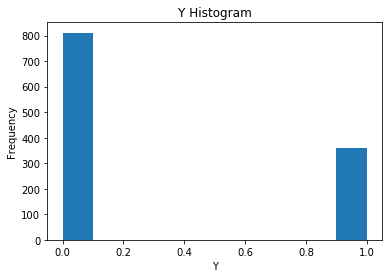


count    1170.000000
mean        0.618803
std         0.485888
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Customer_Type, dtype: float64


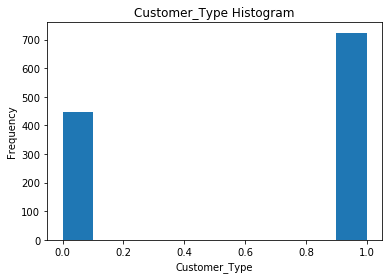


count    1170.000000
mean        0.062393
std         0.241972
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: P_Client, dtype: float64


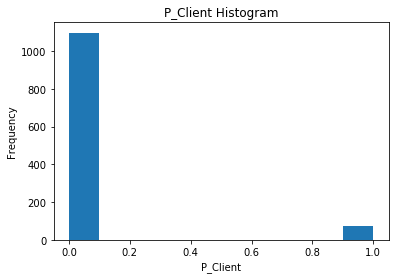


count    1170.000000
mean        0.944444
std         1.374766
min         0.000000
25%         0.000000
50%         0.000000
75%         2.000000
max        20.000000
Name: Number_Of_Dependant, dtype: float64


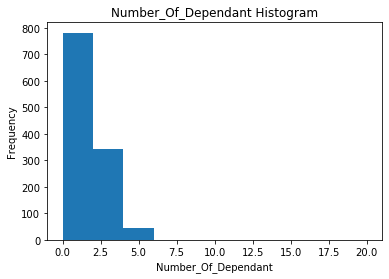


count    1170.000000
mean       12.656410
std         9.910372
min         0.000000
25%         5.000000
50%        10.000000
75%        17.750000
max        60.000000
Name: Years_At_Residence, dtype: float64


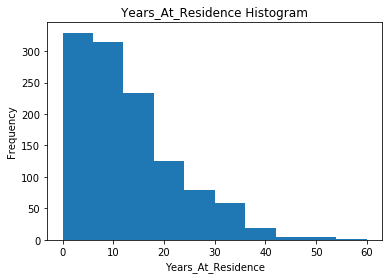


count    1170.000000
mean       44.748455
std        97.030201
min         0.060000
25%        20.000000
50%        36.000000
75%        36.000000
max      2000.000000
Name: Net_Annual_Income, dtype: float64


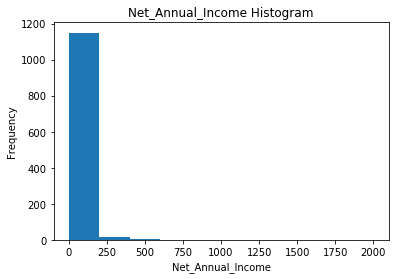


count    1170.000000
mean        3.671795
std         5.864303
min         0.000000
25%         1.000000
50%         1.000000
75%         3.000000
max        98.000000
Name: Years_At_Business, dtype: float64


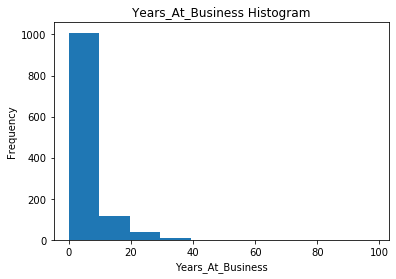


count    1170.000000
mean        0.712821
std         0.452640
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Source, dtype: float64


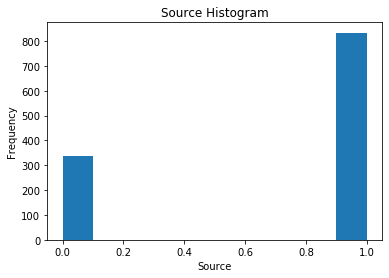


count    1170.000000
mean        1.300855
std         0.492978
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         3.000000
Name: Nb_Of_Products, dtype: float64


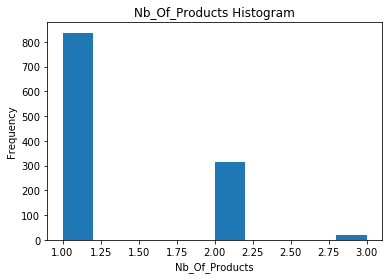


count    1170.000000
mean       37.771795
std        10.890310
min        21.000000
25%        29.000000
50%        35.000000
75%        46.000000
max        71.000000
Name: Age, dtype: float64


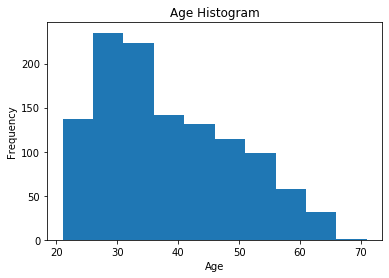


count     1170.000000
mean       317.706838
std        944.373728
min          0.000000
25%          2.000000
50%          8.000000
75%         61.000000
max      10352.000000
Name: Seniority, dtype: float64


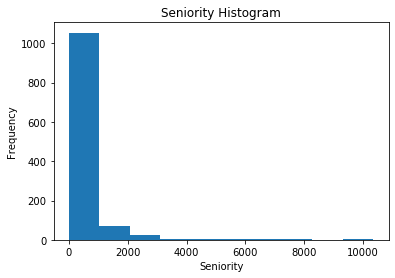


count    1170.000000
mean      394.689744
std       140.310387
min        19.000000
25%       287.000000
50%       373.000000
75%       484.000000
max       754.000000
Name: Credit_Duration, dtype: float64


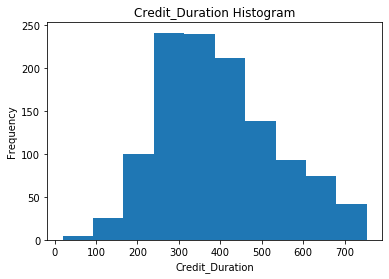

In [18]:
dummy_features = ['Educational_Level', 'Marital_Status', 'Type_Of_Residence', 'Prod_Category', 'Prod_Sub_Category']

for col in df:
    # Not printing dummy features (we'll do that in the next cells)
    is_dummy = False
    for dummy_feature in dummy_features:
        if dummy_feature in col:
            is_dummy = True
            break
            
    if not is_dummy:
        val = df[col]
        print(val.describe())
        val.plot.hist(title = col + ' Histogram')
        plt.xlabel(col)
        plt.show()
        print('')

Plotting dummy data to visualize dummy features.

In [19]:
dummy_count = {}

for dummy_feature in dummy_features:
    encoded_labels = []
    for feature in df:
        if dummy_feature in feature:
            encoded_labels.append(feature)

    dummy_data = {'Labels': [], 'Count': [], 'Count_Fault': []}
    for feature in encoded_labels:
        dummy_data['Count'].append(len(df[df[feature] == 1]))
        dummy_data['Count_Fault'].append(len(df[(df[feature] == 1) & (df['Y'] == 1)]))

    dummy_data['Labels'] = [label.split("_")[-1] for label in encoded_labels]
    dummy_count[dummy_feature] = dummy_data
    


def plot_dummy_features(dummy_feature):
    plt.bar(dummy_count[dummy_feature]['Labels'], dummy_count[dummy_feature]['Count'], width=0.35)
    plt.xlabel(dummy_feature)
    plt.ylabel('Count')
    plt.show()  

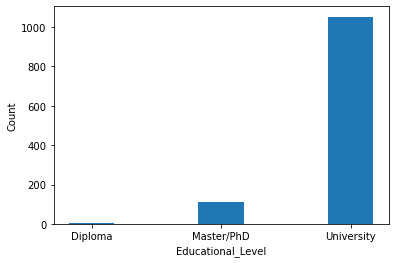

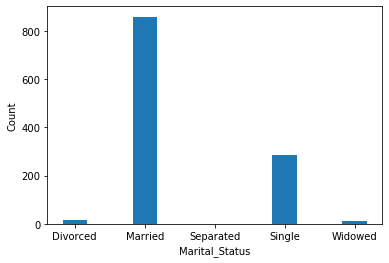

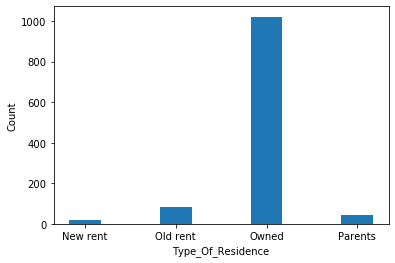

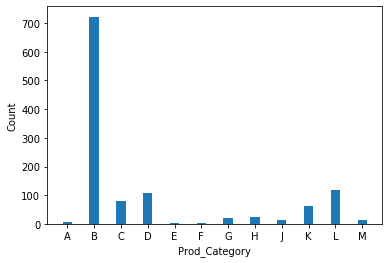

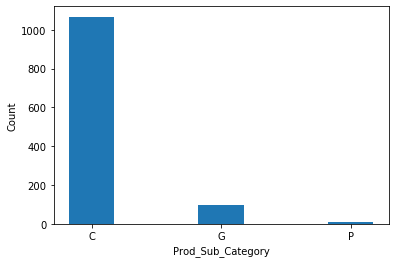

In [20]:
for feature in dummy_features:
    plot_dummy_features(feature)

## 2.2. Checking anomalies

In the previous subsection, we remarked that some features include strange values (anomalies?):
* Number_Of_Dependant
* Net_Annual_Income
* Years_At_Business
* Seniority

We'll study them in detail in the next cells to deem whether they are indeed anomalies or not.

### 2.2.1. Useful functions

In [21]:
nb_tot = df['Y'].count()
    

# Shows details about the feature, and plots it
def details(dataframe, feature):
    val = dataframe[feature]
    print(val.describe(percentiles=[i/10 for i in range(1, 10)]))
    val.plot.hist(title = feature + ' Histogram')
    plt.xlabel(feature)
    plt.show()
    
    
# Plots the number of anomalies, given a set of anomaly thresholds
def plot_anomaly_threshold(dataframe, feature, thresholds, side='max'):
    nb_entries_left = []

    for threshold in thresholds:
        if side == 'max':
            non_anom = dataframe[dataframe[feature] <= threshold]
        else:
            non_anom = dataframe[dataframe[feature] >= threshold]
        nb_entries_left.append(non_anom[feature].count())

    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Anomaly threshold applied')
    ax1.set_ylabel('Number of non-anomalies left')
    ax1.plot(thresholds, nb_entries_left)
    ax2 = ax1.twinx()
    ax2.set_ylabel('Percentage of non-anomalies over the whole set')
    ax2.plot(thresholds, nb_entries_left / nb_tot)
    fig.tight_layout()
    plt.show()     

    
# Returns the number of anomalies, given an anomaly threshold
def info_anomaly_threshold(dataframe, feature, threshold, side='max'):
    if side == 'max':
        non_anom = dataframe[dataframe[feature] <= threshold]
    else:
        non_anom = dataframe[dataframe[feature] >= threshold]
    nb_entries_left = non_anom[feature].count()

    print('With an anomaly threshold of', threshold, ', there are', nb_entries_left, 'rows left over', nb_tot, ', i.e', round(100 * nb_entries_left / nb_tot, 1), '% of the initial dataset')
    
    
# Drops the anomalies, given the anomaly threshold
def drop_anomalies(feature, threshold):
    df.mask(df[feature] > threshold, inplace=True)
    df.dropna(subset=[feature], inplace=True)
    df.reset_index(drop=True, inplace=True)

### 2.2.2. Number_Of_Dependant

count    1170.000000
mean        0.944444
std         1.374766
min         0.000000
10%         0.000000
20%         0.000000
30%         0.000000
40%         0.000000
50%         0.000000
60%         1.000000
70%         2.000000
80%         2.000000
90%         3.000000
max        20.000000
Name: Number_Of_Dependant, dtype: float64


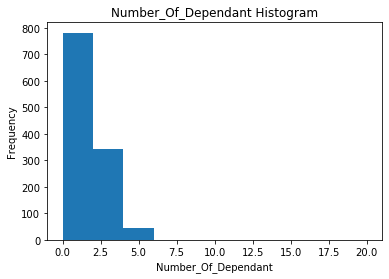

In [22]:
details(df, 'Number_Of_Dependant')

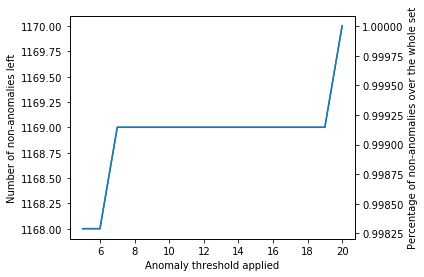

In [23]:
thresholds = [5 + i for i in range(16)]

plot_anomaly_threshold(df, 'Number_Of_Dependant', thresholds)

We arbitrary put the anomaly threshold at 7, as this number of dependants is still plausible - whereas 20 clearly is an anomaly.

In [24]:
threshold = 7

info_anomaly_threshold(df, 'Number_Of_Dependant', threshold)

With an anomaly threshold of 7 , there are 1169 rows left over 1170 , i.e 99.9 % of the initial dataset


### 2.2.3. Net_Annual_Income

count    1170.000000
mean       44.748455
std        97.030201
min         0.060000
10%        18.000000
20%        20.000000
30%        24.944800
40%        30.000000
50%        36.000000
60%        36.000000
70%        36.000000
80%        42.358400
90%        60.000000
max      2000.000000
Name: Net_Annual_Income, dtype: float64


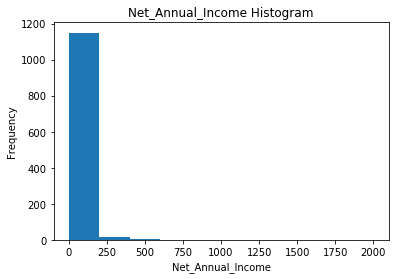

In [25]:
details(df, 'Net_Annual_Income')

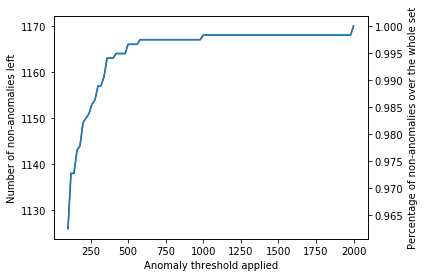

In [26]:
thresholds = [100 + i * 20 for i in range(96)]

plot_anomaly_threshold(df, 'Net_Annual_Income', thresholds)

We arbitrary put the anomaly threshold when the slope becomes almost zero: in this case, around 600.

In [27]:
threshold = 600

info_anomaly_threshold(df, 'Net_Annual_Income', threshold)

With an anomaly threshold of 600 , there are 1167 rows left over 1170 , i.e 99.7 % of the initial dataset


### 2.2.4. Years_At_Business

count    1170.000000
mean        3.671795
std         5.864303
min         0.000000
10%         1.000000
20%         1.000000
30%         1.000000
40%         1.000000
50%         1.000000
60%         2.000000
70%         3.000000
80%         5.000000
90%        10.000000
max        98.000000
Name: Years_At_Business, dtype: float64


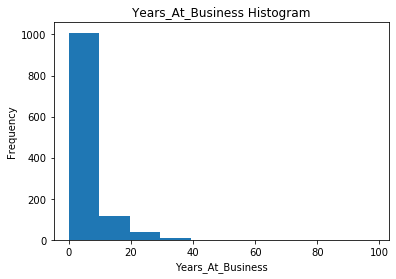

In [28]:
details(df, 'Years_At_Business')

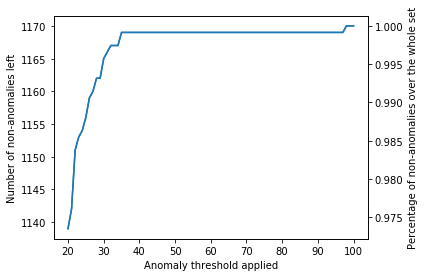

In [29]:
thresholds = [20 + i for i in range(81)]

plot_anomaly_threshold(df, 'Years_At_Business', thresholds)

We arbitrary put the anomaly threshold when the slope becomes almost zero: in this case, around 35.

In [30]:
threshold = 35

info_anomaly_threshold(df, 'Years_At_Business', threshold)

With an anomaly threshold of 35 , there are 1169 rows left over 1170 , i.e 99.9 % of the initial dataset


### 2.2.5. Seniority

count     1170.000000
mean       317.706838
std        944.373728
min          0.000000
10%          1.000000
20%          1.000000
30%          3.000000
40%          5.000000
50%          8.000000
60%         14.000000
70%         29.000000
80%        273.600000
90%       1014.600000
max      10352.000000
Name: Seniority, dtype: float64


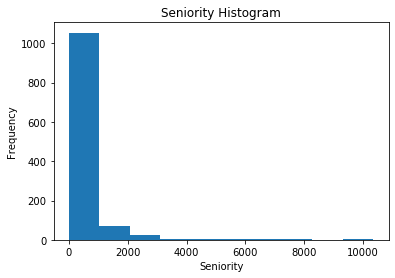

In [31]:
details(df, 'Seniority')

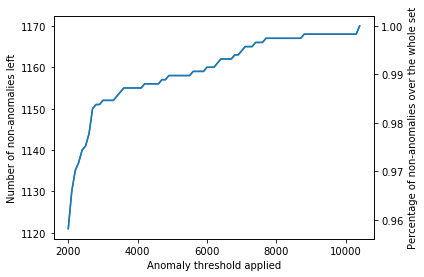

In [32]:
thresholds = [2000 + i * 100 for i in range(85)]

plot_anomaly_threshold(df, 'Seniority', thresholds)

10,000 days amounts to around 27 years, which is not irrelevant in this context.
We decide not to drop rows here.

### 2.2.6. Dropping anomalies

count    1169.000000
mean        0.928144
std         1.257159
min         0.000000
10%         0.000000
20%         0.000000
30%         0.000000
40%         0.000000
50%         0.000000
60%         1.000000
70%         2.000000
80%         2.000000
90%         3.000000
max         7.000000
Name: Number_Of_Dependant, dtype: float64


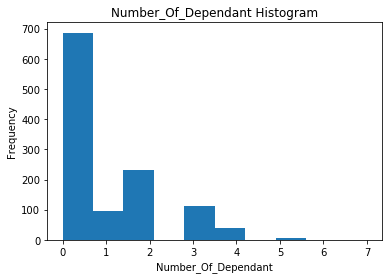

In [33]:
drop_anomalies('Number_Of_Dependant', 7)
details(df, 'Number_Of_Dependant')

count    1166.000000
mean       40.570919
std        45.643441
min         0.060000
10%        18.000000
20%        20.000000
30%        24.816000
40%        30.000000
50%        36.000000
60%        36.000000
70%        36.000000
80%        42.000000
90%        59.400000
max       576.000000
Name: Net_Annual_Income, dtype: float64


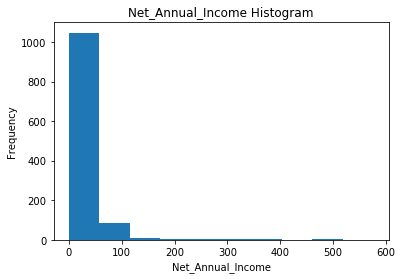

In [34]:
drop_anomalies('Net_Annual_Income', 600)
details(df, 'Net_Annual_Income')

count    1165.000000
mean        3.565665
std         5.131453
min         0.000000
10%         1.000000
20%         1.000000
30%         1.000000
40%         1.000000
50%         1.000000
60%         2.000000
70%         3.000000
80%         5.000000
90%        10.000000
max        35.000000
Name: Years_At_Business, dtype: float64


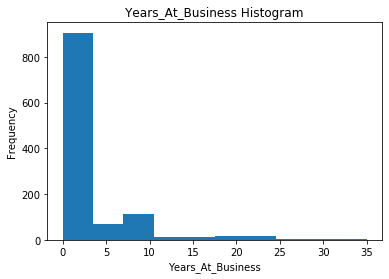

In [35]:
drop_anomalies('Years_At_Business', 35)
details(df, 'Years_At_Business')

### 2.2.7. Checking and cleaning data

#### 2.2.7.1. Customer_Type / Seniority

Non-Existing Clients
count      443.000000
mean       826.866817
std       1392.396470
min          1.000000
25%         28.000000
50%        337.000000
75%       1101.500000
max      10352.000000
Name: Seniority, dtype: float64


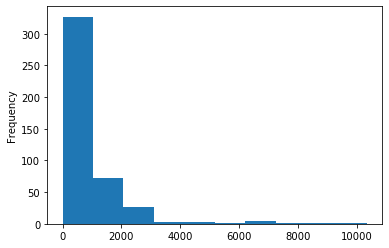


Existing Clients
count    722.000000
mean       6.157895
std       15.154315
min        0.000000
25%        1.000000
50%        3.000000
75%        7.000000
max      363.000000
Name: Seniority, dtype: float64


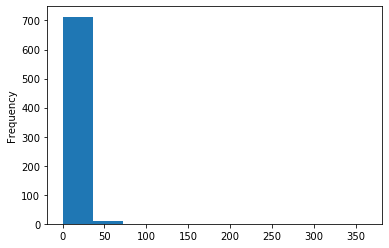

In [36]:
# Printing / plotting Seniority for Non-Existing Clients
print('Non-Existing Clients')
print(df.loc[df['Customer_Type'] == 0]['Seniority'].describe())  
df.loc[df['Customer_Type'] == 0]['Seniority'].plot.hist()
plt.show()
print('')

# Printing / plotting Seniority for Existing Clients
print('Existing Clients')
print(df.loc[df['Customer_Type'] == 1]['Seniority'].describe())  
df.loc[df['Customer_Type'] == 1]['Seniority'].plot.hist()
plt.show()

There is a problem in the dataset: it seems that there has been a mixing in the notation.
Indeed, we see that there is a problem: some existing clients  have a seniority of several days, whereas non-existing clients can have up to one year of seniority.

As we obviously do not fully understand the Customer_Type feature - and its correlation with Y is not that significant, see next cell - we hesitated to drop this feature rather than deleting rows without understanding if they were really skewed or not (beforehand, the feature was used in the model but was not particularly relevant compared to the others).

Finally, we decided not to do so, and to let our models cope with this feature.

In [37]:
print(df.corr()['Y']['Customer_Type'])
df.corr()['Y'].sort_values()

-0.02101452110145881


Nb_Of_Products                 -0.361111
Credit_Duration                -0.318641
Seniority                      -0.119938
Prod_Category_B                -0.116890
Prod_Category_G                -0.088205
P_Client                       -0.080507
Years_At_Residence             -0.070607
Age                            -0.070203
Prod_Category_J                -0.068086
Prod_Sub_Category_G            -0.063002
Prod_Category_D                -0.062472
Educational_Level_Master/PhD   -0.051954
Number_Of_Dependant            -0.034764
Type_Of_Residence_Owned        -0.033871
Prod_Category_F                -0.027676
Prod_Sub_Category_P            -0.022048
Customer_Type                  -0.021015
Marital_Status_Separated       -0.019562
Prod_Category_C                -0.019498
Prod_Category_A                -0.015378
Type_Of_Residence_Parents      -0.015201
Marital_Status_Married         -0.013296
Prod_Category_M                -0.010262
Years_At_Business              -0.001839
Net_Annual_Incom

#### 2.2.7.2. Age / Seniority

count    1165.000000
mean       36.854294
std        10.857283
min         6.695890
10%        23.994521
20%        26.956712
30%        29.005479
40%        31.940274
50%        34.794521
60%        37.968219
70%        42.921644
80%        46.997260
90%        52.991781
max        64.997260
Name: Age - Seniority (years), dtype: float64


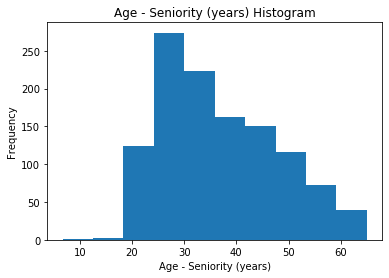

In [38]:
# Printing the age of the client when he/she opens his/her account at the bank insurance
dataframe = pd.DataFrame(df['Age'] - df['Seniority'] / 365, columns=['Age - Seniority (years)'])
details(dataframe, 'Age - Seniority (years)')

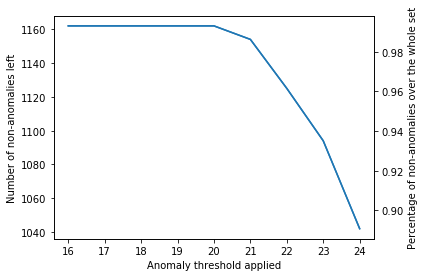

In [39]:
thresholds = [16 + i for i in range(9)]

plot_anomaly_threshold(dataframe, 'Age - Seniority (years)', thresholds, side='min')

In [40]:
threshold = 20

info_anomaly_threshold(dataframe, 'Age - Seniority (years)', threshold, side='min')

With an anomaly threshold of 20 , there are 1162 rows left over 1170 , i.e 99.3 % of the initial dataset


There clearly are anomalies: we will put a threshold at 20, as it is not plausible for someone younger than 20 to already have a credit.

**NB** : Again, these anomalies could have come from the way we calculated these features but we thorougly made sure to use the same reference date on purpose... 

In [41]:
df.drop(dataframe.loc[dataframe['Age - Seniority (years)'] < 20].index, inplace=True)
df.reset_index(drop=True, inplace=True)

#### 2.2.7.3. Age / Years_At_Business

count    1162.000000
mean       34.187608
std        11.138433
min        -1.000000
10%        22.000000
20%        24.000000
30%        26.300000
40%        29.000000
50%        32.000000
60%        35.000000
70%        39.000000
80%        44.000000
90%        51.000000
max        66.000000
Name: Age - Years_At_Business (years), dtype: float64


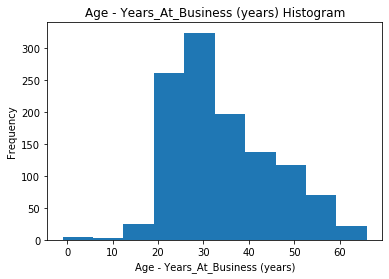

In [42]:
# Printing the age of the client when he/she started his/her current job
dataframe = pd.DataFrame(df['Age'] - df['Years_At_Business'], columns=['Age - Years_At_Business (years)'])
dataframe = dataframe.join(df[['Educational_Level_University', 'Educational_Level_Master/PhD', 'Educational_Level_Diploma']])

details(dataframe, 'Age - Years_At_Business (years)')

The high values are plausible (you can begin a new job at 66 - even if it may not be easy!), but the lowest are suspicious (see that negative value?).

Let's dive into the lower values.

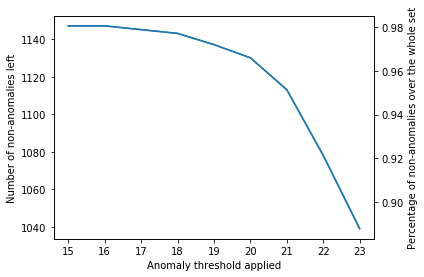

In [43]:
thresholds = [15 + i for i in range(9)]

plot_anomaly_threshold(dataframe, 'Age - Years_At_Business (years)', thresholds, side='min')

In [44]:
threshold = 20

info_anomaly_threshold(dataframe, 'Age - Years_At_Business (years)', threshold, side='min')

With an anomaly threshold of 20 , there are 1130 rows left over 1170 , i.e 96.6 % of the initial dataset


In [45]:
dataframe.loc[dataframe['Age - Years_At_Business (years)'] < 20]

,Age - Years_At_Business (years),Educational_Level_University,Educational_Level_Master/PhD,Educational_Level_Diploma
24,16.0,1.0,0.0,0.0
68,16.0,1.0,0.0,0.0
71,18.0,1.0,0.0,0.0
84,14.0,1.0,0.0,0.0
165,19.0,1.0,0.0,0.0
244,19.0,1.0,0.0,0.0
248,14.0,1.0,0.0,0.0
302,-1.0,1.0,0.0,0.0
331,14.0,1.0,0.0,0.0
364,19.0,1.0,0.0,0.0


We remark that people who have started their current job before 20 went to the university (or earned a Master/PhD!), which is clearly **not compatible** with their educational level.

We then decided to discard these rows.

In [46]:
df.drop(dataframe.loc[dataframe['Age - Years_At_Business (years)'] < 20].index, inplace=True)
df.reset_index(drop=True, inplace=True)

#### 2.2.7.4. Age / Years_At_Residence

count    1130.000000
mean       25.530973
std        13.651016
min       -15.000000
10%         5.000000
20%        14.000000
30%        20.000000
40%        24.000000
50%        26.000000
60%        29.000000
70%        32.000000
80%        37.000000
90%        43.000000
max        67.000000
Name: Age - Years_At_Residence (years), dtype: float64


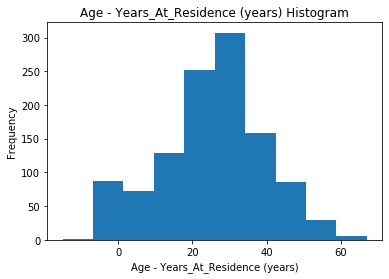

In [47]:
# Printing the age of the client when he/she started to live in his/her current residence
dataframe = pd.DataFrame(df['Age'] - df['Years_At_Residence'], columns=['Age - Years_At_Residence (years)'])
dataframe = dataframe.join(df[['Type_Of_Residence_Parents', 'Type_Of_Residence_Old rent', 
                               'Type_Of_Residence_New rent', 'Type_Of_Residence_Owned']])

details(dataframe, 'Age - Years_At_Residence (years)')

We remark that there are some negative values: we wanted to drop them, and then to study rows with Age-Years_At_Business < 20 (i.e people who lives at their residence since they are 20 or less).

However, in the +300 rows we got, 284 of them where representing people who owned or had an old rent in this residence - at less than 20 years old! This number of anomalies being very high, we realized that we did not know **how was computed Year_At_Residence**: we arbitrarily thought that it was calculated until the beginning of the credit - just like we computed Age - but that may not be the case. (Other possible interpretation : Maybe the residence used to belong to the client's parents, therefore the client owns it since he/she is "-10" years old.)

We then decided not to drop any row based on this criteria.

## 2.3. Exploring data

We'll need to normalize our data before computing any correlation:

In [48]:
df_normalized = []
scaler = MinMaxScaler(feature_range = (0, 1))

scaler.fit(df)
df_normalized = scaler.transform(df)
df_normalized = pd.DataFrame(data=df_normalized, columns=df.columns)

In [49]:
df_normalized

,Y,Customer_Type,P_Client,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Source,Nb_Of_Products,Age,Seniority,Credit_Duration,Educational_Level_Diploma,Educational_Level_Master/PhD,Educational_Level_University,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Separated,Marital_Status_Single,Marital_Status_Widowed,Prod_Sub_Category_C,Prod_Sub_Category_G,Prod_Sub_Category_P,Type_Of_Residence_New rent,Type_Of_Residence_Old rent,Type_Of_Residence_Owned,Type_Of_Residence_Parents,Prod_Category_A,Prod_Category_B,Prod_Category_C,Prod_Category_D,Prod_Category_E,Prod_Category_F,Prod_Category_G,Prod_Category_H,Prod_Category_J,Prod_Category_K,Prod_Category_L,Prod_Category_M
0,1.0,0.0,0.0,0.428571,0.050000,0.071889,0.028571,1.0,0.0,0.16,0.001256,0.628571,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,1.0,0.0,0.000000,0.250000,0.071889,0.028571,1.0,0.0,0.76,0.000097,0.476190,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.571429,0.583333,0.175101,0.057143,1.0,0.0,0.54,0.000580,0.742857,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,1.0,0.0,0.285714,0.016667,0.071889,0.028571,1.0,0.0,0.18,0.000290,0.326531,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.000000,0.450000,0.052686,0.171429,0.0,0.0,0.12,0.001449,0.541497,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1125,0.0,0.0,0.0,0.428571,0.750000,0.039885,0.028571,1.0,0.5,0.56,0.178226,0.650340,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1126,0.0,1.0,0.0,0.000000,0.016667,0.039885,0.028571,0.0,0.5,0.56,0.000097,0.319728,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1127,1.0,0.0,0.0,0.000000,0.250000,0.099892,0.200000,1.0,0.0,0.34,0.002801,0.400000,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1128,1.0,0.0,0.0,0.428571,0.250000,0.049518,0.028571,1.0,0.0,0.16,0.001835,0.624490,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [50]:
df_normalized.describe().loc[['min', 'max'], :]

,Y,Customer_Type,P_Client,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Source,Nb_Of_Products,Age,Seniority,Credit_Duration,Educational_Level_Diploma,Educational_Level_Master/PhD,Educational_Level_University,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Separated,Marital_Status_Single,Marital_Status_Widowed,Prod_Sub_Category_C,Prod_Sub_Category_G,Prod_Sub_Category_P,Type_Of_Residence_New rent,Type_Of_Residence_Old rent,Type_Of_Residence_Owned,Type_Of_Residence_Parents,Prod_Category_A,Prod_Category_B,Prod_Category_C,Prod_Category_D,Prod_Category_E,Prod_Category_F,Prod_Category_G,Prod_Category_H,Prod_Category_J,Prod_Category_K,Prod_Category_L,Prod_Category_M
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


### 2.3.1. Correlations with Y

In [51]:
correlations = df_normalized.corr()['Y'].sort_values()
correlations.drop(labels='Y', inplace=True)

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 Marital_Status_Single           0.016700
Prod_Category_E                 0.017610
Educational_Level_Diploma       0.020794
Prod_Category_H                 0.021690
Prod_Category_K                 0.039145
Educational_Level_University    0.043628
Prod_Sub_Category_C             0.063790
Type_Of_Residence_New rent      0.077074
Source                          0.108150
Prod_Category_L                 0.289689
Name: Y, dtype: float64

Most Negative Correlations:
 Nb_Of_Products       -0.362085
Credit_Duration      -0.319638
Seniority            -0.115227
Prod_Category_B      -0.109369
Prod_Category_G      -0.089359
P_Client             -0.087781
Prod_Category_D      -0.069104
Prod_Category_J      -0.068969
Age                  -0.067977
Years_At_Residence   -0.065872
Name: Y, dtype: float64


From this quick correlation computation, 6 features stand out (i.e their absolute values are greater than 0.1 - arbitrary threshold):
* Nb_Of_Products
* Credit_Duration
* Prod_Category_L
* Seniority
* Source
* Prod_Category_B

We will plot the **percentage of Y=1 for every feature**, so as to better see the correlation between them.

Some useful functions:

In [52]:
data_fault = df.loc[df['Y'] == 1]


# Plots count of features with Y=1 over the whole batch
def plot_density(feature, bins=25):
    plt.hist(df[feature], bins=bins)
    plt.hist(data_fault[feature], bins=bins)
        
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.title('Distribution of ' + feature)
    plt.legend(['Y=0', 'Y=1'])
    plt.show()  

    
# Plots percentage of Y=1 over the whole batch
def plot_percentage(feature, bins=25):
    min_feature = df[feature].describe().loc['min']
    max_feature = df[feature].describe().loc['max']
    size_bins = (max_feature - min_feature) / bins
    
    percentage = np.zeros(bins + 1)
    percentage_fault = np.zeros(bins + 1)
    
    # Counting occurences of data in each binned interval
    for el in df[feature].values:
        index = int((el - min_feature) / size_bins)
        percentage[index] += 1    
    for el in data_fault[feature].values:
        index = int((el - min_feature) / size_bins)
        percentage_fault[index] += 1
    
    # Calculating the number of data in each interval (so as to know whether we can trust it or not)
    widths = np.copy(percentage)
    min_count, max_count = np.min(widths), np.max(widths)
    for i, el in enumerate(widths):
        widths[i] = (size_bins / 1.5) * (0.5 + 0.5 * (el - min_count) / (max_count - min_count))
    
    # Calculating percentage of Y=1 over the whole batch
    percentage_fault = percentage_fault / percentage
    percentage_fault[np.isnan(percentage_fault)] = 0
    percentage = percentage / percentage
    percentage[np.isnan(percentage)] = 0
    
    
    plt.figure(figsize = (15, 11))
    plt.bar([min_feature + i * size_bins for i in range(bins + 1)], percentage, width=widths)
    plt.bar([min_feature + i * size_bins for i in range(bins + 1)], percentage_fault, width=widths)
    
    # Printing percentages on top of every bar
    for i, el in enumerate(percentage_fault):
        plt.gca().annotate('{}{}'.format(int(100 * el), '%'),
                            xy=(min_feature + i * size_bins, 1.),
                            xytext=(0, 11),
                            textcoords="offset points",
                            ha='center', va='bottom')
        
    plt.xlabel(feature)
    plt.ylabel('Percentage')
    plt.legend(['Y=0', 'Y=1'])
    plt.show()  

Nb_Of_Products
Correlation with Y: -0.36208526285142245


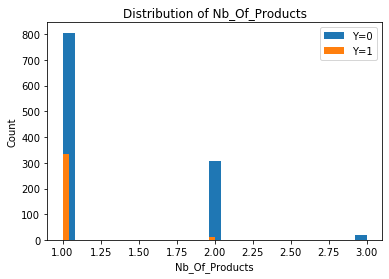

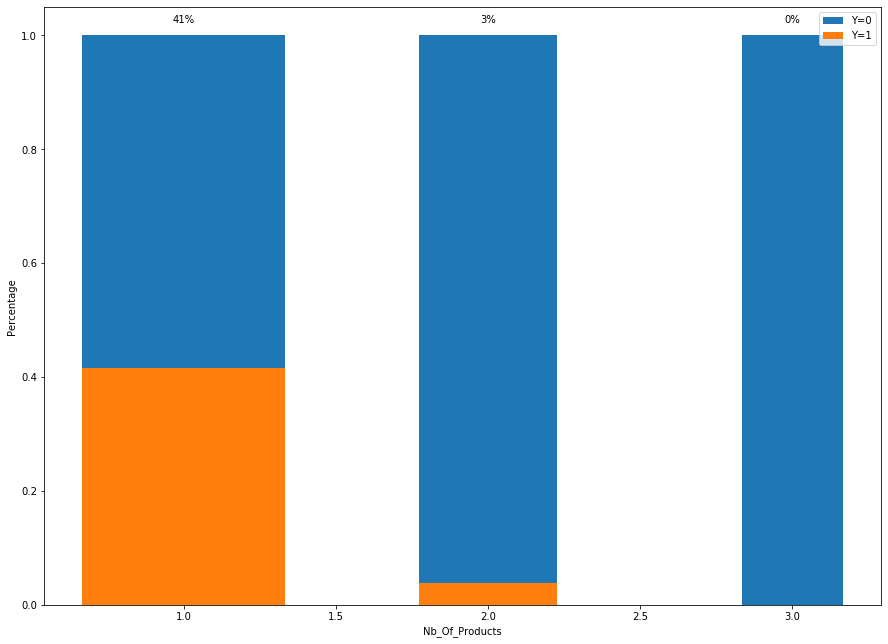

Credit_Duration
Correlation with Y: -0.31963778212100463


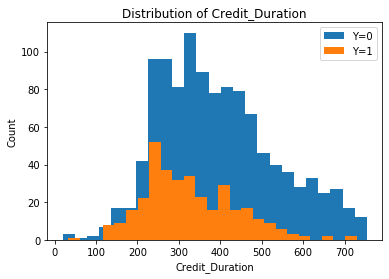

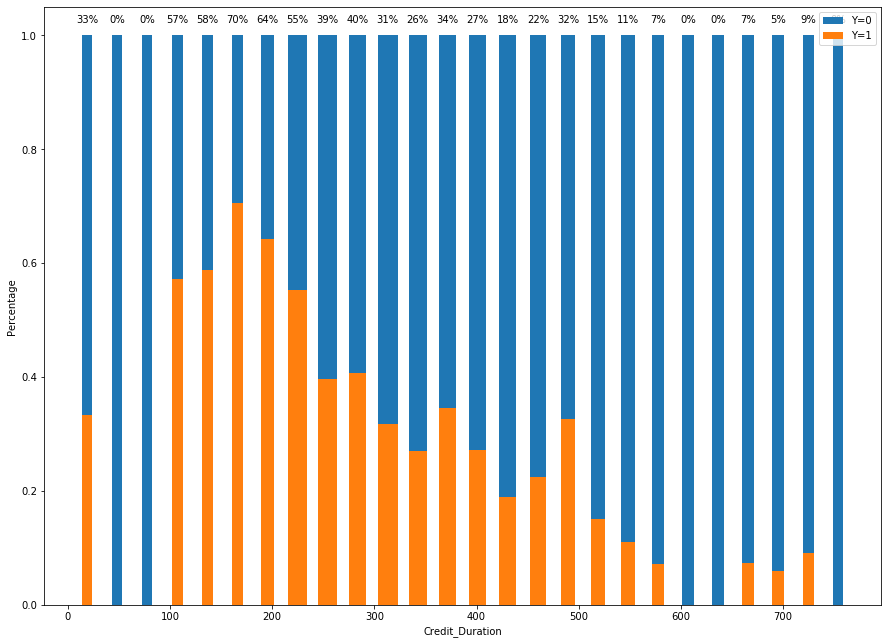

Seniority
Correlation with Y: -0.1152274554424239


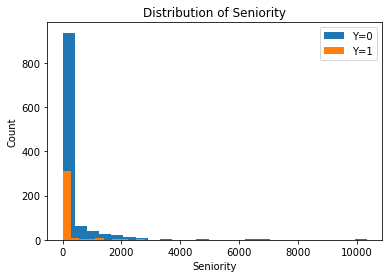

C:\Users\Flo\Anaconda3\lib\site-packages\ipykernel_launcher.py:40: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\Flo\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning:

invalid value encountered in true_divide



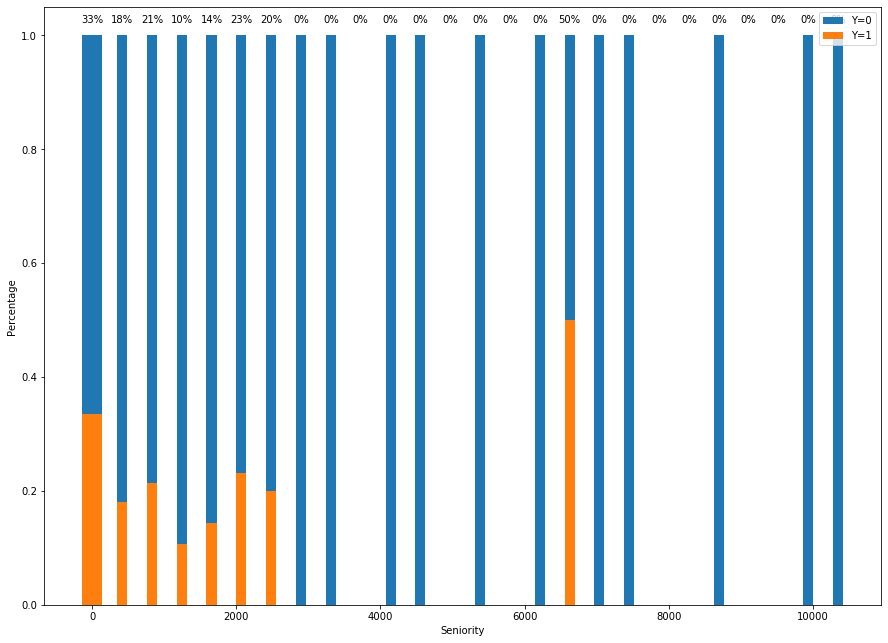

P_Client
Correlation with Y: -0.08778120158323267


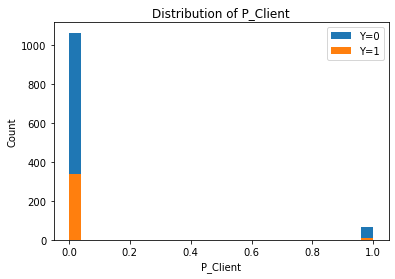

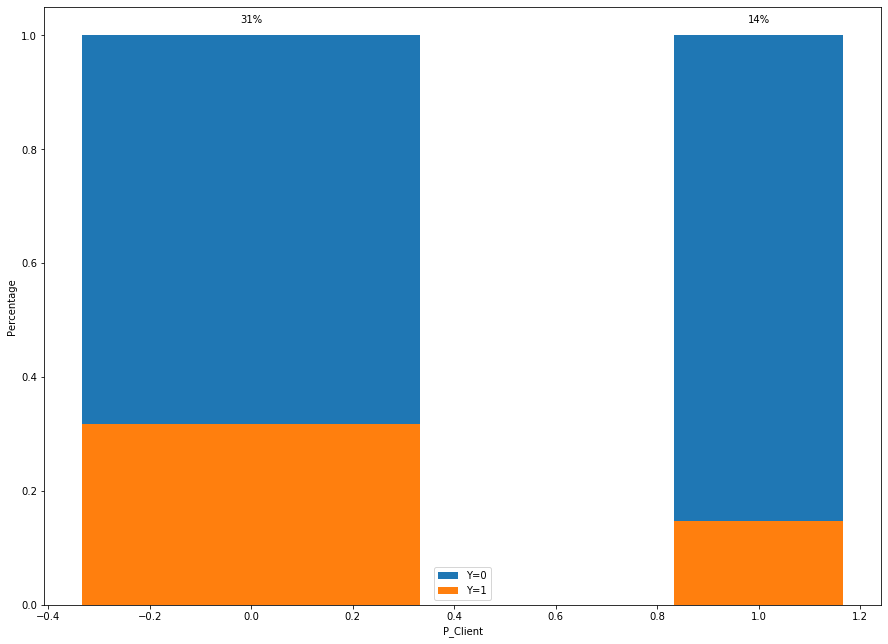

Age
Correlation with Y: -0.06797676486402762


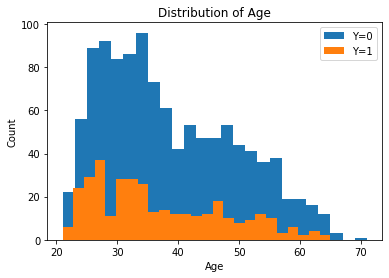

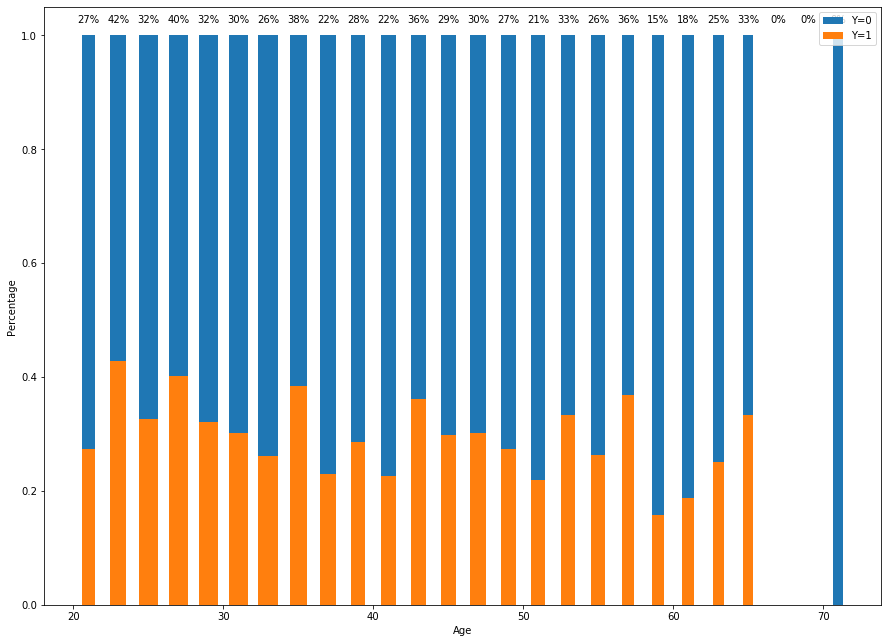

Years_At_Residence
Correlation with Y: -0.06587237189232273


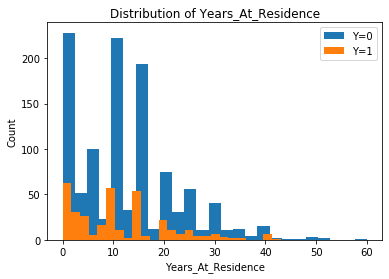

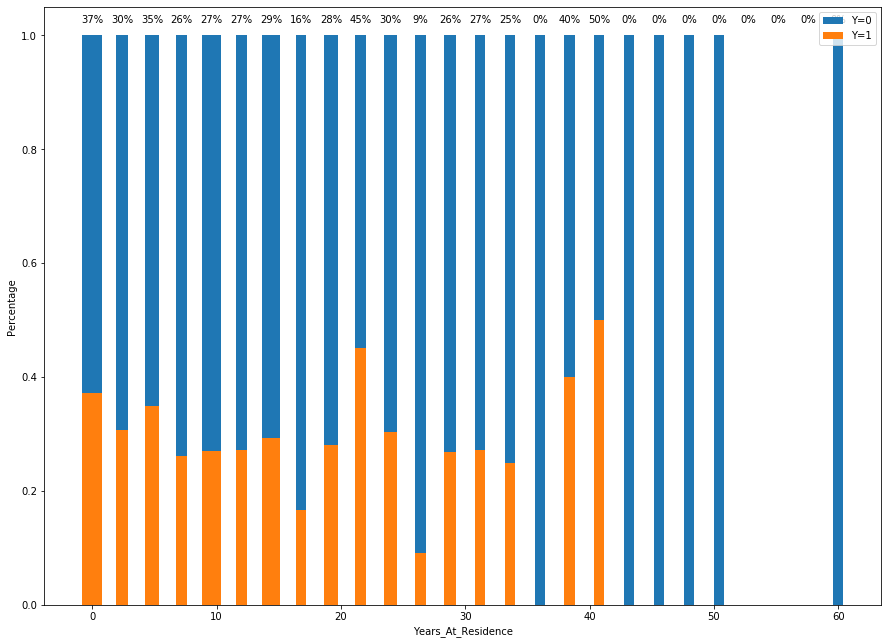

Number_Of_Dependant
Correlation with Y: -0.032522654395165614


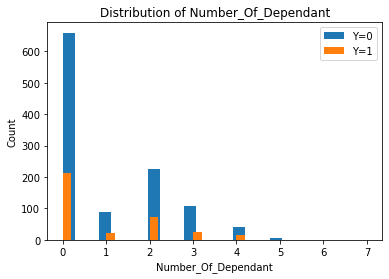

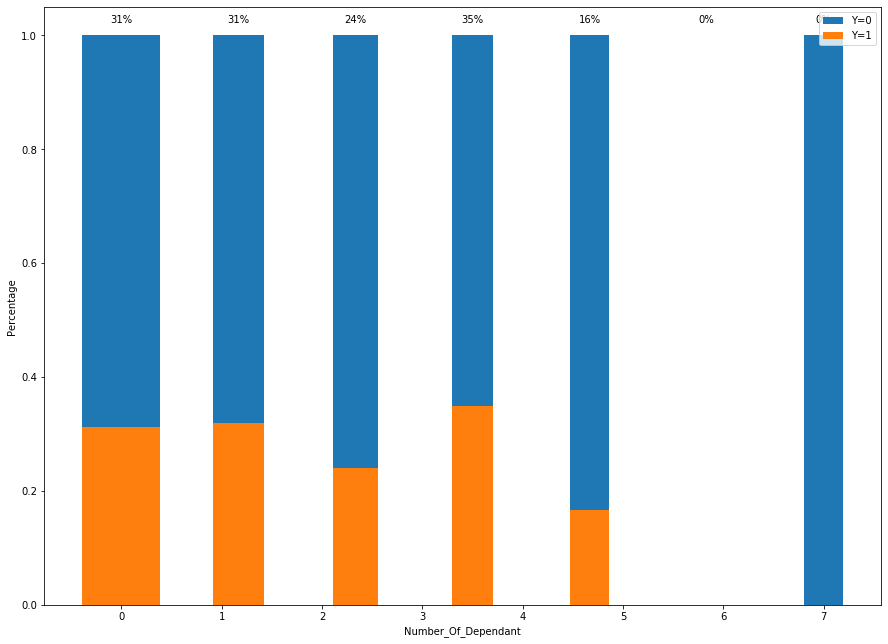

Customer_Type
Correlation with Y: -0.019012035475617542


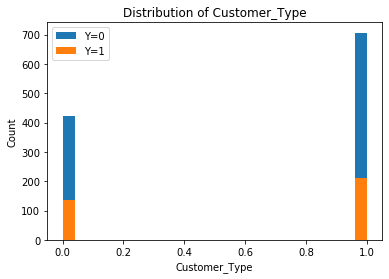

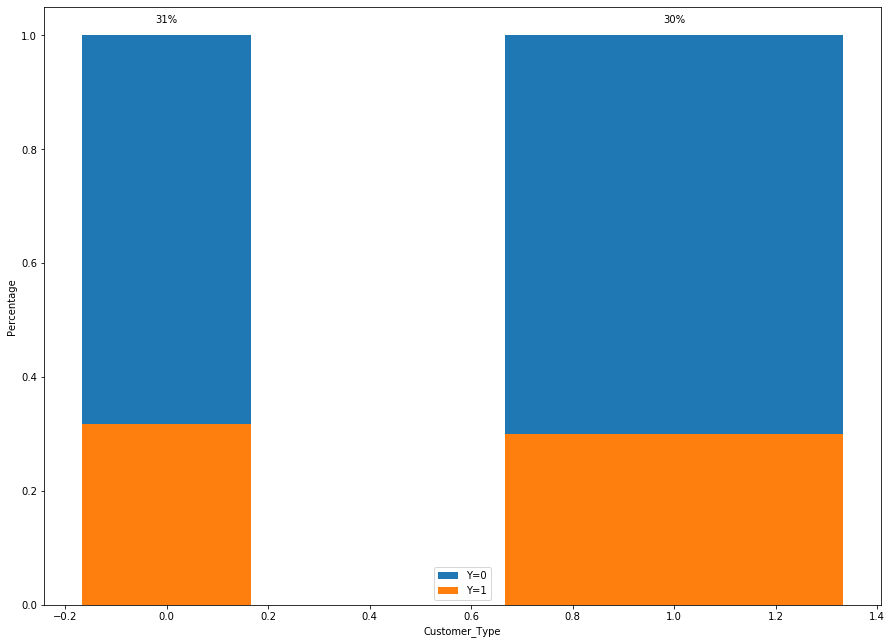

Net_Annual_Income
Correlation with Y: -0.016520445280004584


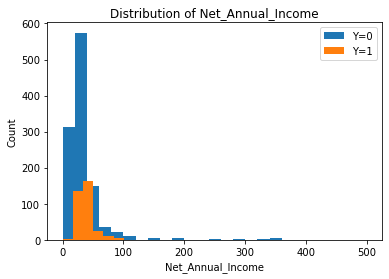

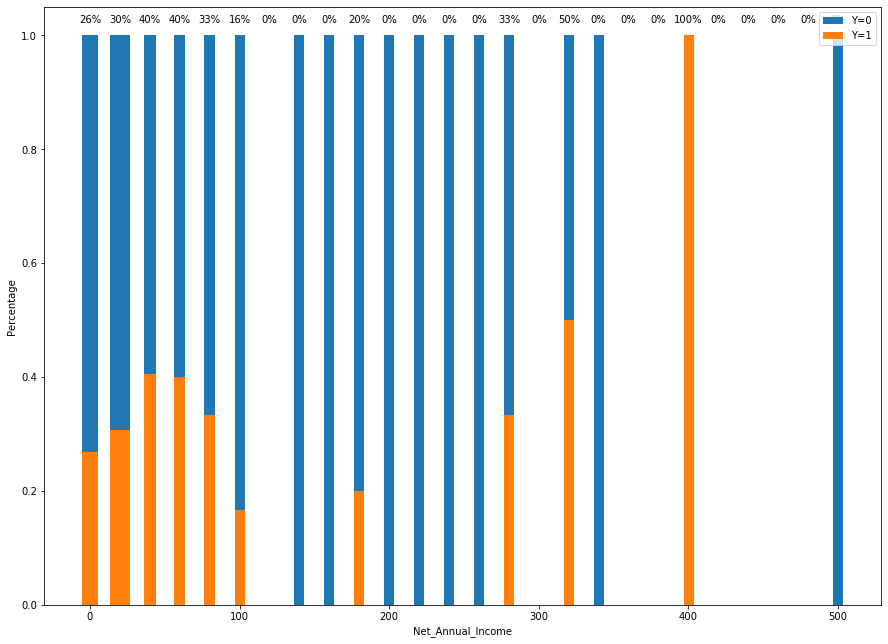

Years_At_Business
Correlation with Y: -0.008830425876819568


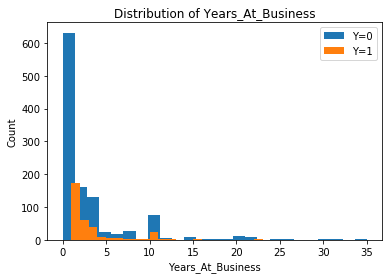

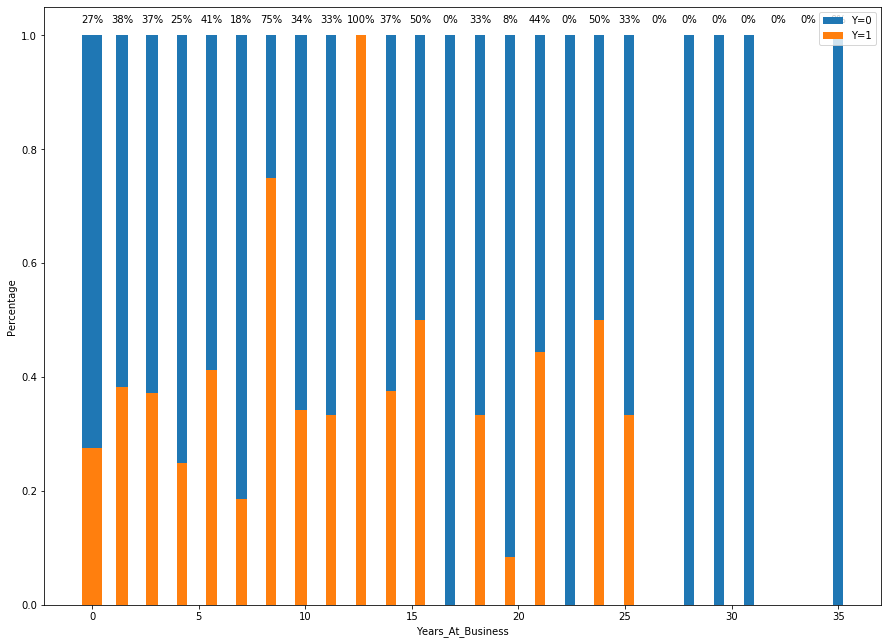

Source
Correlation with Y: 0.10815023412266828


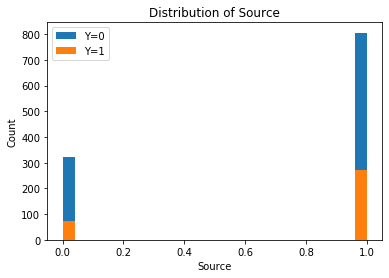

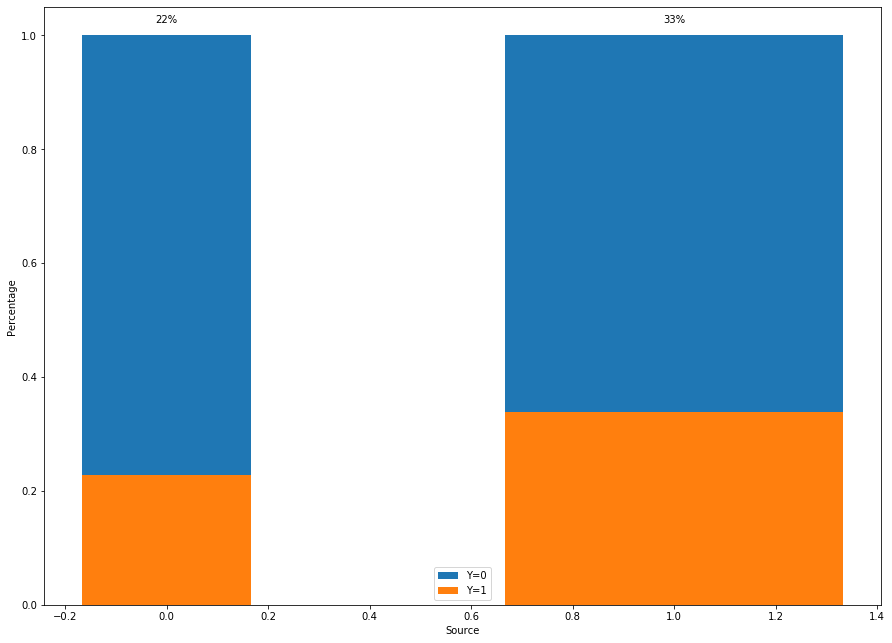

In [53]:
for feature in correlations.index:
    # Not printing dummy features (we'll do that in the next cells)
    is_dummy = False
    for dummy_feature in dummy_features:
        if dummy_feature in feature:
            is_dummy = True
            break
            
    if not is_dummy:
        print(feature)
        print('Correlation with Y:', correlations[feature])

        # To bin data into the correct number of intervals (when 25 is too much)
        if len(list(df[feature].unique())) <= 7:
            plot_density(feature)
            plot_percentage(feature, bins=len(list(df[feature].unique())) - 1)
        else:
            plot_density(feature)
            plot_percentage(feature)

**NB** : The size of the bar gives the number of clients.

#### Analysis :
* Nb_Of_Products: when a client has been granted several products, it is logical that he/she is more likely to repay them - we expect the credit company to allow multiple credits to people respecting even more stringent conditions - thus more likely to repay everything
* Credit_Duration: we learn that if a credit lasts 6-7 months, it is less likely that the client will fault
* Seniority: the longer the client is in the credit company, the less likely he/she is to fault; yet, we do not have many data with high seniorities. The only lesson we can draw is that if a client is new (low seniority), he/she is more likely to fault
* Age: it seems that younger people are a bit more likely to fault, compared to older people (older people may have a more stable situation, thus we expect the credit company to have granted a credit only to people who could repay it - yet they are more likely to die, and to not repay the credit!). We remark that they are more young people than older ones in the credit company clients (see the width of bars, proportional to the number of rows in that interval)
* Years_At_Residence: the tendancy is not that clear, but people living in their current residence may have a more stable situation (thus repaying their credit more often)
* Number_Of_Dependant: here again, the correlation is not that important, but we can observe a decrease of the percentage of fault when the number of dependants increases (the situation of such households might be a bit more stable)
* Net_Annual_Income: unlike what we thought at first sight, the annual income of the client is not that correlated to his/her propension to fault in his/her credit repayment - at least the tendancy is hard to interpret
* Years_At_Business: same as Net_Annual_Income

In [54]:
def plot_density_dummy_features(dummy_feature):    
    plt.bar(dummy_count[dummy_feature]['Labels'], dummy_count[dummy_feature]['Count'], width=0.35)
    plt.bar(dummy_count[dummy_feature]['Labels'], dummy_count[dummy_feature]['Count_Fault'], width=0.35)
    
    print(dummy_feature)
    plt.xlabel(dummy_feature)
    plt.ylabel('Count')
    plt.title('Distribution of ' + dummy_feature)
    plt.legend(['Y=0', 'Y=1'])
    plt.show()  


def plot_percentage_dummy_features(dummy_feature):
    # Calculating the number of data in each interval (so as to know whether we can trust it or not)
    widths = np.copy(np.array(dummy_count[dummy_feature]['Count']).astype(float))
    min_count, max_count = np.min(widths), np.max(widths)
    for i, el in enumerate(widths):
        widths[i] = 0.5 + 0.5 * (el - min_count) / (max_count - min_count)
    
    # Calculating percentage of Y=1 over the whole batch
    percentage_fault = np.array(dummy_count[dummy_feature]['Count_Fault']) / np.array(dummy_count[dummy_feature]['Count'])
    percentage_fault[np.isnan(percentage_fault)] = 0
    percentage = np.array(dummy_count[dummy_feature]['Count']) / np.array(dummy_count[dummy_feature]['Count'])
    percentage[np.isnan(percentage)] = 0
    
    
    plt.figure(figsize = (15, 11))
    plt.bar(dummy_count[dummy_feature]['Labels'], percentage, widths)
    plt.bar(dummy_count[dummy_feature]['Labels'], percentage_fault, widths)
    
    # Printing percentages on top of every bar
    for i, el in enumerate(percentage_fault):
        plt.gca().annotate('{}{}'.format(int(100 * el), '%'),
                            xy=(i, 1.),
                            xytext=(0, 11),
                            textcoords="offset points",
                            ha='center', va='bottom')
        
    plt.xlabel(dummy_feature)
    plt.ylabel('Percentage')
    plt.legend(['Y=0', 'Y=1'])
    plt.show()  

Educational_Level


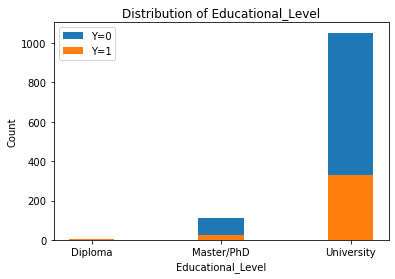

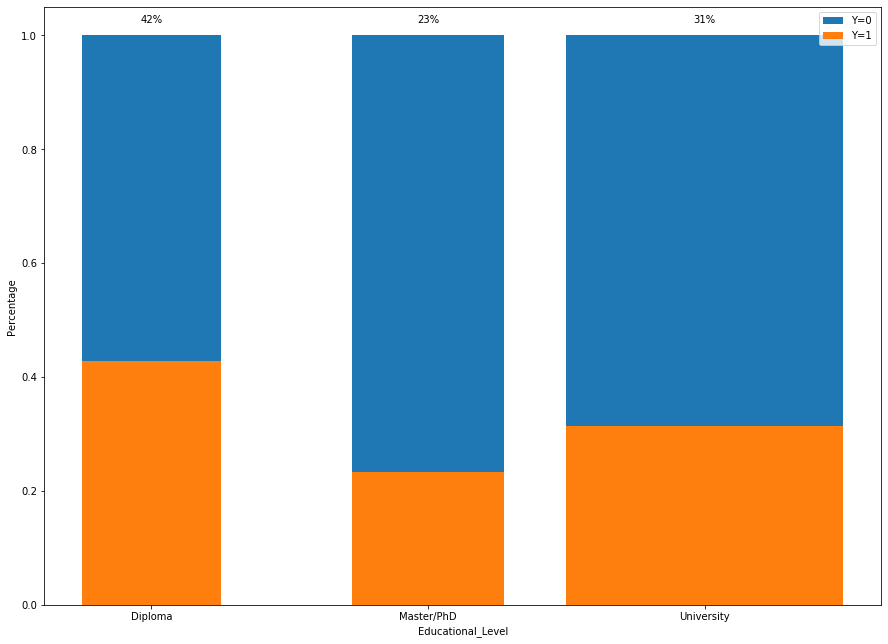

Marital_Status


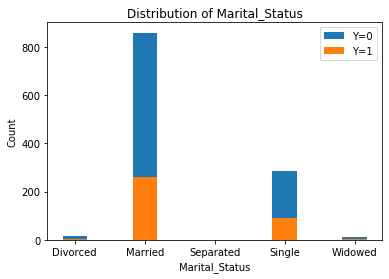

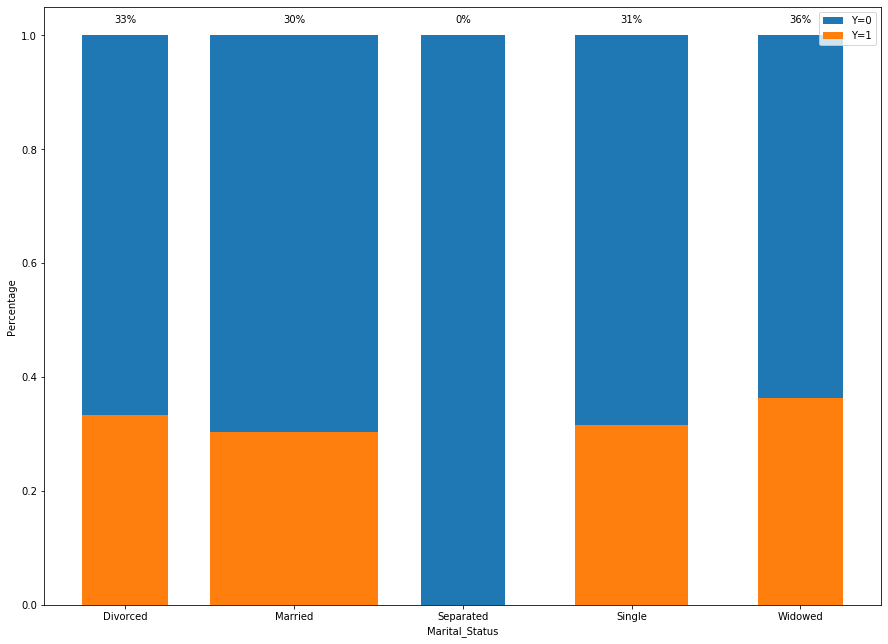

Type_Of_Residence


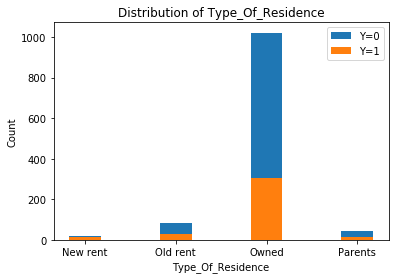

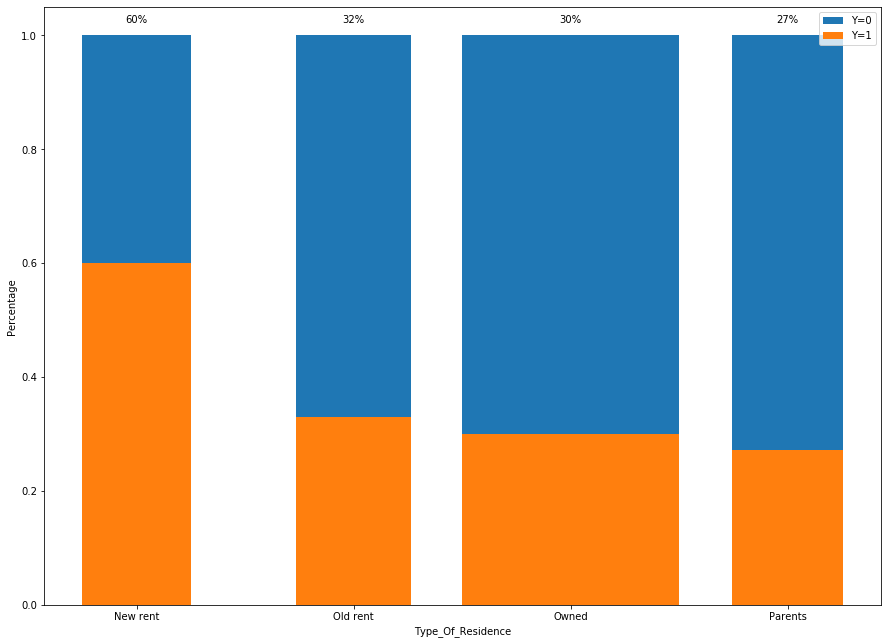

Prod_Category


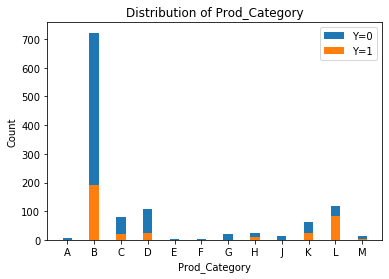

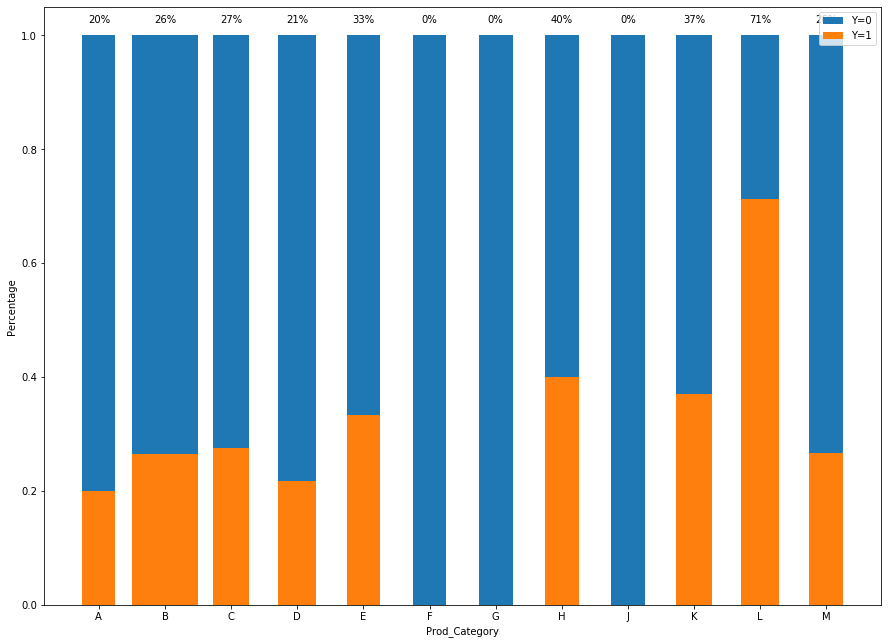

Prod_Sub_Category


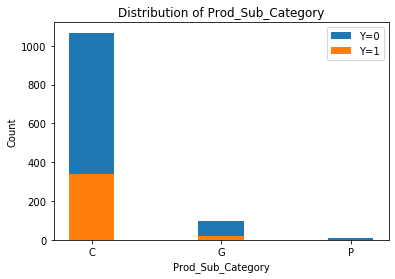

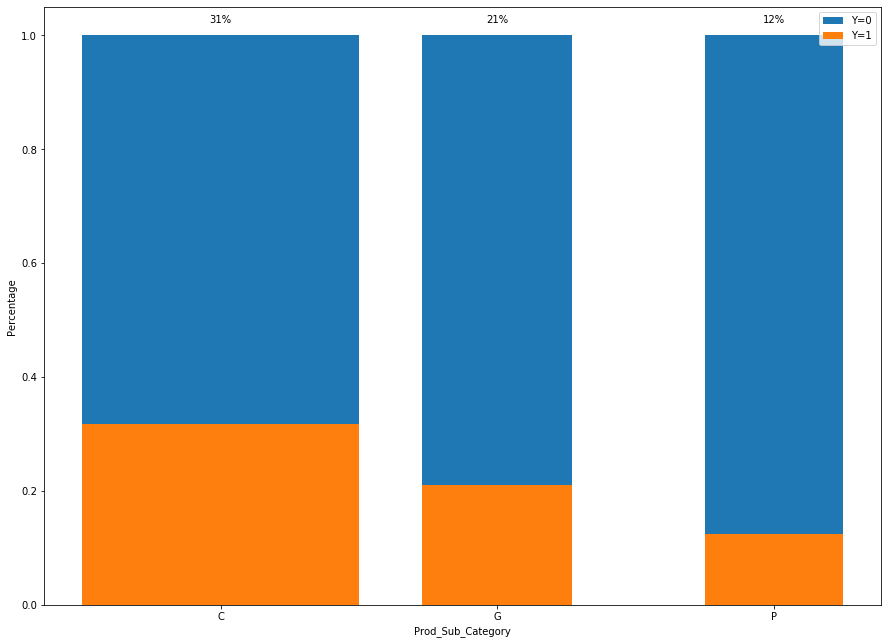

In [55]:
for dummy_feature in dummy_features:
    plot_density_dummy_features(dummy_feature)
    plot_percentage_dummy_features(dummy_feature)

#### Analysis :
* Educational_Level: the higher the educational level, the more stable the situation - thus the less likely the client is to fault
* Marital_Status: this feature is not correlated with Y, as each category has the same percentage of credit faults - the Separated category contains only one row, and is not to be taken account in our current analysis
* Type_Of_Residence: we observe that people in a new rent are much more likely to fault, compared to people in an old rent, in an owned residence, or still living at their parents (thus having a more stable situation)
* Prod_Category: we observe discrepancies between the categories, but we cannot draw any conclusion as we have no further information on them
* Prod_Sub_Category: same as Prod_Category

### 2.3.2. Correlations between features

Let's see if other features are correlated with one another: a heatmap may be the easiest way to find such relations.

Text(0.5, 1, 'Correlation Heatmap')

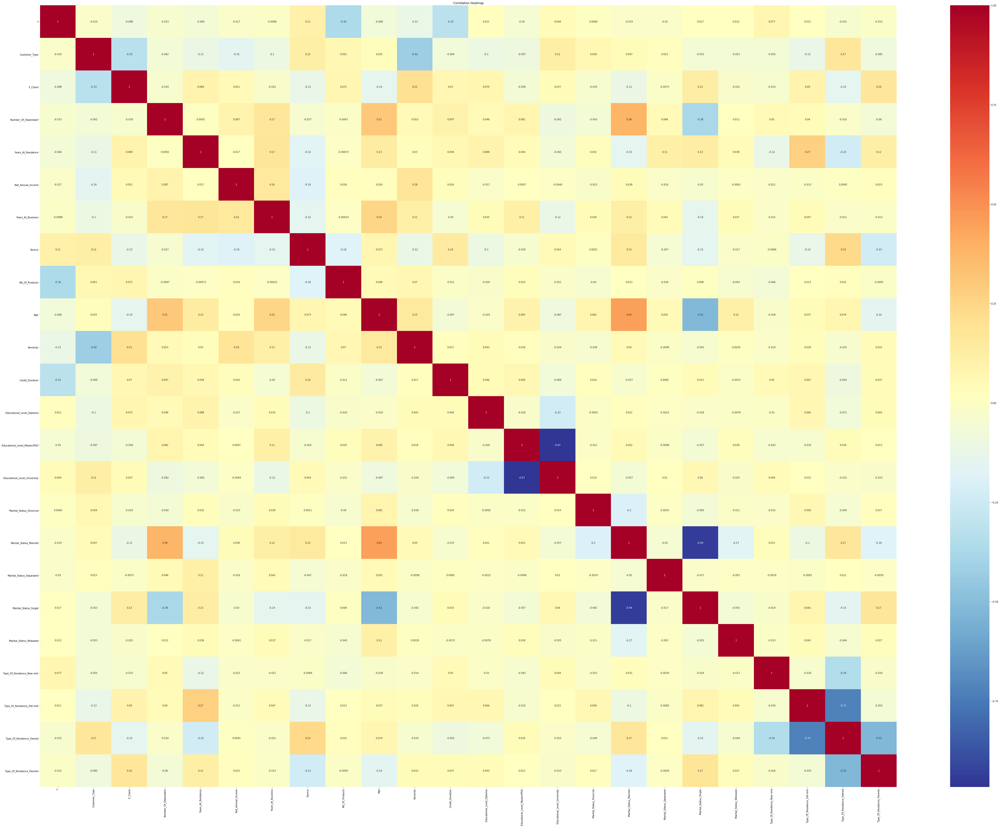

In [56]:
plt.figure(figsize = (80, 60))

prod_categories = ['Prod_Category_A', 'Prod_Category_B', 'Prod_Category_C', 
              'Prod_Category_D','Prod_Category_E','Prod_Category_F', 
              'Prod_Category_G', 'Prod_Category_H', 'Prod_Category_J', 
              'Prod_Category_K', 'Prod_Category_L', 'Prod_Category_M']
prod_sub_categories = ['Prod_Sub_Category_C', 'Prod_Sub_Category_G', 'Prod_Sub_Category_P']

sns.heatmap(df_normalized.drop(columns=prod_categories + prod_sub_categories).corr(), cmap=plt.cm.RdYlBu_r, annot=True)
plt.title('Correlation Heatmap')

We meet again features such as Nb_Of_Product or Credit_Duration that are relatively strongly correlated with Y.

Let's look at the highest correlated pairs of features:

In [57]:
correlations = df_normalized.drop(columns=prod_categories + prod_sub_categories).corr()

# Keeping only high correlations
correlations.mask((-0.2 < correlations) & (correlations < 0.2), inplace=True)
correlations_is_not_nan = correlations.notna()
highest_corr = pd.DataFrame({'Feature_1': [], 'Feature_2': [], 'Correlation': []})

corr_columns = correlations.columns
n_columns = len(corr_columns)

for i in range(1, n_columns):
    for j in range(i+1, n_columns):
        if correlations_is_not_nan[corr_columns[i]][corr_columns[j]]:
            highest_corr = highest_corr.append({'Feature_1': corr_columns[i], 'Feature_2': corr_columns[j], 'Correlation': correlations[corr_columns[i]][corr_columns[j]]}, 
                                               ignore_index=True, sort=True)
            
highest_corr

,Correlation,Feature_1,Feature_2
0,-0.326521,Customer_Type,P_Client
1,-0.421071,Customer_Type,Seniority
2,0.206972,P_Client,Seniority
3,0.308329,Number_Of_Dependant,Age
4,0.378637,Number_Of_Dependant,Marital_Status_Married
5,-0.382093,Number_Of_Dependant,Marital_Status_Single
6,0.273858,Years_At_Residence,Type_Of_Residence_Old rent
7,-0.234814,Years_At_Residence,Type_Of_Residence_Owned
8,0.249491,Years_At_Business,Age
9,0.231922,Source,Type_Of_Residence_Owned


Some correlations have no point (the last 6 in the table hereinabove), as this correlation only comes from our initial encoding.

In [58]:
# Run this case only ONCE
highest_corr.drop([i for i in range(11, 17)], inplace=True)
highest_corr.sort_values(by=['Correlation'], inplace=True)

highest_corr

,Correlation,Feature_1,Feature_2
17,-0.728089,Type_Of_Residence_Old rent,Type_Of_Residence_Owned
18,-0.524631,Type_Of_Residence_Owned,Type_Of_Residence_Parents
1,-0.421071,Customer_Type,Seniority
5,-0.382093,Number_Of_Dependant,Marital_Status_Single
0,-0.326521,Customer_Type,P_Client
7,-0.234814,Years_At_Residence,Type_Of_Residence_Owned
10,-0.231876,Source,Type_Of_Residence_Parents
2,0.206972,P_Client,Seniority
9,0.231922,Source,Type_Of_Residence_Owned
8,0.249491,Years_At_Business,Age


#### Analysis :
Remarkable negative correlations:
* Age / Marital_Status_Single: the older the client, the less likely he/she is to be single
* Number_Of_Dependant / Marital_Status_Single: if the client is single, he/she is less likely to have any (or many) dependants
* Years_At_Residence / Type_Of_Residence_Owned: clients may ask for a credit so as to buy their residence, that is why there are mostly "young buyers"
* Source / Type_Of_Residence_Parents: ? We can't interprete *Source*.

Remarkable positive correlations:
* Age / Marital_Status_Married: the older the client, the more likely he/she is to be married
* Number_Of_Dependant / Marital_Status_Married: if the client is married, he/she is more likely to have some dependants
* Number_Of_Dependant / Age: the older the client, the more likely he/she is to have dependants
* Years_At_Residence / Type_Of_Residence_Old rent: pretty obvious, "Old" rent
* Years_At_Business / Age: the older the person, the more likely he/she is to have worked for long in his/her current job
* Source / Type_Of_Residence_Owned: ? We can't interprete *Source*.
* P_Client / Seniority: ? We can't interprete *P_Client*.

As we have no further information on how is computed P_Client and what Source represents, some correlations are marked with "???".

Yet, it is likely that P_Client takes into account the Seniority of a client: the P_Client / Seniority does not seem absurd.

### 2.3.3. Computing correlations given a Prod_Category

Our next target is to find to **what type of clients** or **what type of credit** correspond the products' categories. Let's see if we can spot any abnormal behaviour depending on the Prod_Category.

In [59]:
correlations_with_prod = df_normalized.drop(columns=prod_sub_categories).corr()

Text(0.5, 1, 'Correlation Heatmap')

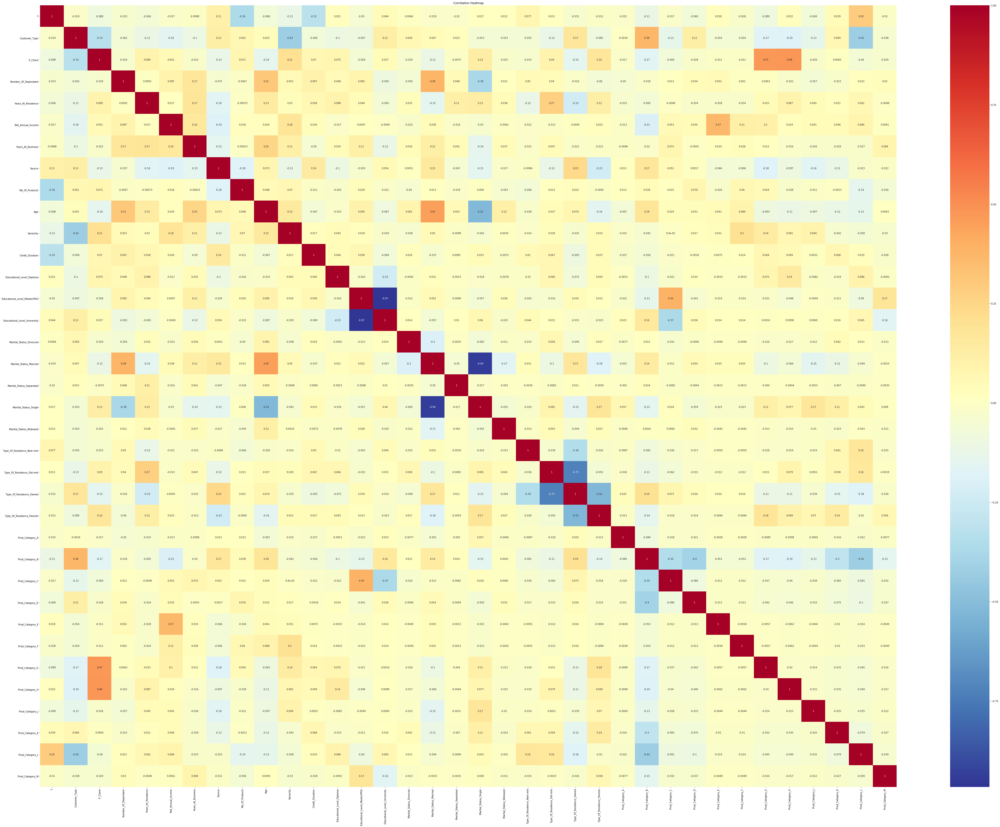

In [60]:
plt.figure(figsize = (80, 60))

sns.heatmap(correlations_with_prod, cmap=plt.cm.RdYlBu_r, annot=True)
plt.title('Correlation Heatmap')

In [61]:
correlations_with_prod.mask(correlations_with_prod == 1.0, inplace=True)
cat_highest_corr = pd.DataFrame({'Prod_Category': [], 'Feature_Correlated': [], 'Correlation': []})

for feature in correlations_with_prod:
    if 'Prod_Category' in feature:
        corrs = {'Prod_Category': [feature, feature, feature, feature], 'Feature_Correlated': [], 'Correlation': []}
        highest_corr = correlations_with_prod[feature].sort_values()
        
        count = 0
        for i in range(len(highest_corr)):
            if count == 2:
                break
            if 'Prod_Category' not in highest_corr.index[i] and highest_corr.index[i] != 'Y':
                corrs['Feature_Correlated'].append(highest_corr.index[i])
                corrs['Correlation'].append(highest_corr[i])
                count += 1
                
        count = 0
        for i in range(len(highest_corr)):
            if count == 2:
                break
            if 'Prod_Category' not in highest_corr.index[-1-i] and highest_corr.index[-1-i] != 'Y':
                corrs['Feature_Correlated'].append(highest_corr.index[-1-i])
                corrs['Correlation'].append(highest_corr[-1-i])
                count += 1
                
        cat_highest_corr = cat_highest_corr.append(pd.DataFrame(corrs), ignore_index=True)
        

cat_highest_corr

,Prod_Category,Feature_Correlated,Correlation
0,Prod_Category_A,Age,-0.066870
1,Prod_Category_A,Marital_Status_Married,-0.051446
2,Prod_Category_A,Marital_Status_Single,0.056868
3,Prod_Category_A,Type_Of_Residence_Owned,0.025274
4,Prod_Category_B,Net_Annual_Income,-0.205629
5,Prod_Category_B,P_Client,-0.167426
6,Prod_Category_B,Customer_Type,0.376367
7,Prod_Category_B,Type_Of_Residence_Owned,0.194656
8,Prod_Category_C,Educational_Level_University,-0.373860
9,Prod_Category_C,Customer_Type,-0.131581


#### Analysis :
Thanks to this table, we can try to guess what the client type aimed is for each category (not always significant) :
* A: A young (single) person
* B: A person with a high degree that is already in active life (he/she does not live at his/her parents, he/she has been married...)
* C: A new client, with a high degree and already working for several years
* D: A wealthy person, who may be an old client of the credit company
* E: A wealthy client (who likely is or has been married), who has been working for several years
* F: An old client of the company (who likely is or has been married), who has been working for several years (he/she is likely to be old)
* G: A  person that still lives at his/her parents (likely a quite young person)
* H: Same as G
* J: Same as G
* K: Same as G
* L: A person who rents his/her residence, not among the whealthiest clients (rarely more than one credit, renting property)
* M: A person with a high degree

### 2.4. Constructing new features & Determining profiles

As seen previously, most of features' correlations can be explained logically. These correlations show that there might be an underlying logic behind those data. Therefore our next task will be to create new features from this analysis by trying to attribute a catagory/profile to each client.

### 2.4.1. Classifying profiles

Our guess is that it might be possible to separate the clients between different profiles (which might be correlated to the product category). For instance, we can imagine simple profiles that could give us a hint of wheter they will succeed to repay the credit or not :
- young people with a high degree that who started to work early and seem to have take their lives into their hands,
- older people with children, poor revenues, no owned residence etc.

We will try two methods to classify the clients.

**NB** : We will cluster the dataset with all the data without the column Y. We allow ourselves to do so because during the training session, the train sets will be much bigger than the test sets. We therefore consider that the influence of the small test set on the following clusetrisation can be neglected.

**NB2** : From an unknown new dataset, finding the class of a client would come down to classify him/her based on the profiled found. We would for instance use the k-neighbors method using the same used norm.

#### 2.4.1.1. K-means Clustering

We first determine the number clusters using the elbow method with the norm L2.

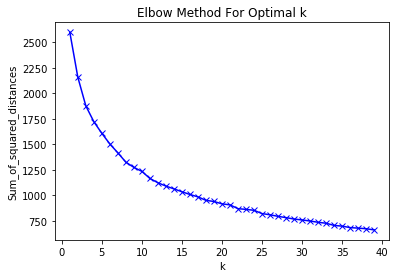

In [62]:
sum_of_squared_distances = []
K = range(1,40)
for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(df_normalized.drop(columns="Y"))
    sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

The elbow is unclear but we estimate that there's an abrupt change of slope at k = 10.

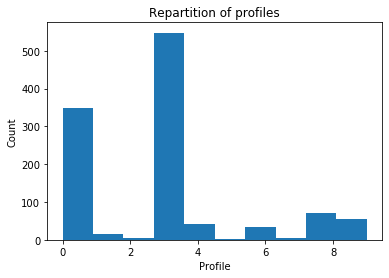

In [63]:
# Number of clusters
n_cluster = 10

# Clustering
kmeans = KMeans(n_clusters=n_cluster)
kmeans = kmeans.fit(df.drop(columns="Y"))

# Display the profiles' repartition
plt.hist(kmeans.labels_)
plt.xlabel('Profile')
plt.ylabel('Count')
plt.title('Repartition of profiles')
plt.show()

We see that some profiles don't include enough clients to be well grounded. For this reason, we will only keep the ones including at least 40 clients (arbitrary).

Now, let's get an overview of the quality of this clusterisation.

In [64]:
# Overview of the clusterisation
labels = pd.Series(kmeans.labels_)
df_class = df.copy()

for i in range (n_cluster) :
    df_class[str(i)] = np.where(labels == i, 1, 0)

classes = [df_class.mean()]
categorized = 0
for i in range (n_cluster) :
    if (len(labels[labels==i])>40) :
        print('Number of profile '+str(i) +' : '+str(len(labels[labels==i])))
        categorized += len(labels[labels==i])
        classes.append(df_class[df_class[str(i)]==1].mean())
print('Number of clients categorized : '+str(categorized)+', ie. '+str(categorized*100/len(df))+'% of the clients.')
pd.DataFrame(classes)

Number of profile 0 : 350
Number of profile 3 : 548
Number of profile 4 : 42
Number of profile 8 : 72
Number of profile 9 : 55
Number of clients categorized : 1067, ie. 94.42477876106194% of the clients.


,Y,Customer_Type,P_Client,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Source,Nb_Of_Products,Age,Seniority,Credit_Duration,Educational_Level_Diploma,Educational_Level_Master/PhD,Educational_Level_University,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Separated,Marital_Status_Single,Marital_Status_Widowed,Prod_Sub_Category_C,Prod_Sub_Category_G,Prod_Sub_Category_P,Type_Of_Residence_New rent,Type_Of_Residence_Old rent,Type_Of_Residence_Owned,Type_Of_Residence_Parents,Prod_Category_A,Prod_Category_B,Prod_Category_C,Prod_Category_D,Prod_Category_E,Prod_Category_F,Prod_Category_G,Prod_Category_H,Prod_Category_J,Prod_Category_K,Prod_Category_L,Prod_Category_M,0,1,2,3,4,5,6,7,8,9
0,0.307080,0.624779,0.060177,0.940708,12.538053,39.901094,3.308850,0.713274,1.302655,38.069027,305.091150,393.800000,0.006195,0.097345,0.896460,0.013274,0.738938,0.000885,0.237168,0.009735,0.912389,0.082301,0.005310,0.016814,0.070796,0.874336,0.038053,0.004425,0.615929,0.069912,0.090265,0.001770,0.00177,0.017699,0.021239,0.010619,0.053097,0.100000,0.013274,0.309735,0.014159,0.00531,0.484956,0.037168,0.002655,0.030088,0.00354,0.063717,0.048673
1,0.185714,0.754286,0.011429,1.011429,12.640000,38.404566,2.925714,0.822857,1.274286,37.251429,16.448571,537.274286,0.008571,0.094286,0.897143,0.022857,0.720000,0.002857,0.245714,0.008571,0.934286,0.065714,0.000000,0.025714,0.085714,0.854286,0.034286,0.000000,0.614286,0.057143,0.102857,0.000000,0.00000,0.002857,0.005714,0.002857,0.065714,0.134286,0.014286,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
2,0.447080,0.804745,0.014599,0.852190,11.992701,36.681035,3.200730,0.689781,1.302920,38.040146,13.458029,298.492701,0.000000,0.082117,0.917883,0.012774,0.757299,0.000000,0.222628,0.007299,0.923358,0.076642,0.000000,0.012774,0.049270,0.908759,0.029197,0.007299,0.647810,0.072993,0.089416,0.000000,0.00000,0.003650,0.010949,0.001825,0.051095,0.100365,0.014599,0.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
3,0.190476,0.000000,0.333333,1.190476,14.690476,50.046619,3.642857,0.595238,1.380952,40.071429,1323.404762,405.023810,0.023810,0.119048,0.857143,0.000000,0.690476,0.000000,0.285714,0.023810,0.880952,0.071429,0.047619,0.000000,0.119048,0.833333,0.047619,0.000000,0.619048,0.023810,0.023810,0.023810,0.00000,0.119048,0.071429,0.023810,0.095238,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000
4,0.180556,0.013889,0.263889,0.777778,13.875000,35.495333,3.819444,0.708333,1.291667,36.361111,402.458333,404.166667,0.013889,0.125000,0.861111,0.000000,0.652778,0.000000,0.319444,0.027778,0.861111,0.138889,0.000000,0.000000,0.083333,0.875000,0.041667,0.013889,0.500000,0.111111,0.041667,0.000000,0.00000,0.083333,0.083333,0.027778,0.055556,0.055556,0.027778,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
5,0.127273,0.000000,0.163636,1.072727,12.472727,55.952309,3.581818,0.600000,1.327273,39.400000,836.436364,386.327273,0.000000,0.218182,0.781818,0.000000,0.709091,0.000000,0.272727,0.018182,0.872727,0.090909,0.036364,0.036364,0.054545,0.800000,0.109091,0.000000,0.563636,0.127273,0.090909,0.018182,0.00000,0.036364,0.054545,0.036364,0.018182,0.054545,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000


The overview of the classification doesn't enable us to easily differentiate profiles in an explicit manner. However, surprisingly, the profiles naturally separate the clients who have more or less chance to repay the credit, which might be really useful. Therefore we can add these classification's features to our dataframe.

In [65]:
df_class.corr()['Y'].sort_values()[:10]

Nb_Of_Products    -0.362085
Credit_Duration   -0.319638
0                 -0.176244
Seniority         -0.115227
Prod_Category_B   -0.109369
Prod_Category_G   -0.089359
9                 -0.088169
P_Client          -0.087781
8                 -0.071553
Prod_Category_D   -0.069104
Name: Y, dtype: float64

#### 2.4.1.2. Spectral Clustering

It is harder to determine the best number of clusters with spctral methods. We try different numbers while staying relatively low (to ensure the quality of the clustering) to estimate it.

We then proceed in the same way to determine the quality of the cluserisation.

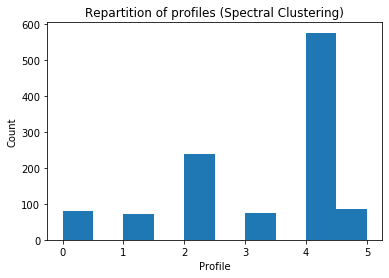

In [66]:
n_spectral_cluster = 6
labels_spectral = SpectralClustering(n_clusters = n_spectral_cluster, eigen_solver='arpack',
        affinity="nearest_neighbors").fit_predict(df_normalized.drop(columns = 'Y'))

# Display the profiles' repartition
plt.hist(labels_spectral)
plt.xlabel('Profile')
plt.ylabel('Count')
plt.title('Repartition of profiles (Spectral Clustering)')
plt.show()

In [67]:
# Overview of the clusterisation
df_class_spectral = df.copy()

for i in range (n_spectral_cluster) :
    df_class_spectral[str(i)] = np.where(labels_spectral == i, 1, 0)

classes = [df_class_spectral.mean()]
categorized = 0
for i in range (n_spectral_cluster) :
    if (len(labels_spectral[labels_spectral==i])>40) :
        print('Number of profile '+str(i) +' : '+str(len(labels_spectral[labels_spectral==i])))
        categorized += len(labels_spectral[labels_spectral==i])
        classes.append(df_class_spectral[df_class_spectral[str(i)]==1].mean())
print('Number of clients categorized : '+str(categorized)+', ie. '+str(categorized*100/len(df))+'% of the clients.')
pd.DataFrame(classes)

Number of profile 0 : 80
Number of profile 1 : 73
Number of profile 2 : 240
Number of profile 3 : 75
Number of profile 4 : 577
Number of profile 5 : 85
Number of clients categorized : 1130, ie. 100.0% of the clients.


,Y,Customer_Type,P_Client,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Source,Nb_Of_Products,Age,Seniority,Credit_Duration,Educational_Level_Diploma,Educational_Level_Master/PhD,Educational_Level_University,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Separated,Marital_Status_Single,Marital_Status_Widowed,Prod_Sub_Category_C,Prod_Sub_Category_G,Prod_Sub_Category_P,Type_Of_Residence_New rent,Type_Of_Residence_Old rent,Type_Of_Residence_Owned,Type_Of_Residence_Parents,Prod_Category_A,Prod_Category_B,Prod_Category_C,Prod_Category_D,Prod_Category_E,Prod_Category_F,Prod_Category_G,Prod_Category_H,Prod_Category_J,Prod_Category_K,Prod_Category_L,Prod_Category_M,0,1,2,3,4,5
0,0.307080,0.624779,0.060177,0.940708,12.538053,39.901094,3.308850,0.713274,1.302655,38.069027,305.091150,393.800000,0.006195,0.097345,0.896460,0.013274,0.738938,0.000885,0.237168,0.009735,0.912389,0.082301,0.005310,0.016814,0.070796,0.874336,0.038053,0.004425,0.615929,0.069912,0.090265,0.001770,0.001770,0.017699,0.021239,0.010619,0.053097,0.100000,0.013274,0.070796,0.064602,0.212389,0.066372,0.510619,0.075221
1,0.225000,0.000000,0.000000,1.050000,10.962500,29.825000,4.050000,1.000000,1.250000,44.262500,1125.762500,396.662500,0.000000,0.000000,1.000000,0.000000,0.962500,0.000000,0.000000,0.037500,1.000000,0.000000,0.000000,0.025000,0.000000,0.975000,0.000000,0.000000,0.987500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012500,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.013699,1.000000,0.000000,0.876712,9.835616,38.536986,2.849315,1.000000,2.068493,41.273973,4.479452,436.136986,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.013699,0.958904,0.027397,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
3,0.404167,1.000000,0.000000,1.045833,10.462500,33.833333,2.912500,1.000000,1.000000,41.129167,4.387500,384.716667,0.000000,0.000000,1.000000,0.020833,0.979167,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.008333,0.000000,0.987500,0.004167,0.004167,0.987500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008333,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
4,0.240000,1.000000,0.000000,1.373333,11.986667,36.034667,4.106667,0.000000,1.520000,41.946667,5.493333,310.626667,0.000000,0.000000,1.000000,0.000000,0.960000,0.013333,0.000000,0.026667,1.000000,0.000000,0.000000,0.000000,0.000000,0.986667,0.013333,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
5,0.341421,0.431542,0.114385,0.788562,14.197574,43.892977,3.299827,0.606586,1.294627,34.506066,378.922010,403.871750,0.010399,0.181976,0.807626,0.015598,0.511265,0.000000,0.464471,0.008666,0.828423,0.161179,0.010399,0.024263,0.131716,0.772964,0.071057,0.005199,0.407279,0.133449,0.029463,0.003466,0.003466,0.034662,0.041594,0.020797,0.103986,0.195841,0.020797,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
6,0.188235,0.811765,0.023529,1.247059,11.423529,44.002212,3.482353,0.741176,1.411765,41.611765,403.082353,385.411765,0.011765,0.058824,0.929412,0.011765,0.976471,0.000000,0.000000,0.011765,1.000000,0.000000,0.000000,0.011765,0.047059,0.941176,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


Again, not all but some profiles show clear correlations with Y. We can keep the interesting ones (arbitrarly).

In [68]:
df_class.corr()['Y'].sort_values()[:5]

Nb_Of_Products    -0.362085
Credit_Duration   -0.319638
0                 -0.176244
Seniority         -0.115227
Prod_Category_B   -0.109369
Name: Y, dtype: float64

In [69]:
# Adding the new features to the dataframe

# Kmeans features
for i in range (n_cluster) :
    if (len(labels[labels==i])>40) :
        df_normalized['kmeans_'+str(i)] = df_class[str(i)]

# Spectral features
for i in range (n_spectral_cluster) :
    if (len(labels_spectral[labels_spectral==i])>40) :
        df_normalized['spectral_'+str(i)] = df_class_spectral[str(i)]
        

### 2.4.2. Guessed features

Our last intuition to categorize client is to deduce new features from the basic ones.

- **Success_Career** : We try to define the success of the client's carreer by dividing his/her annual income by his/her age. We've tried multiple approaches to deduce such a feature, by considering the evolution of his/her income linearly (starting income and positive slope) or exponentially (starting income and bonus of x% each year for instance) but did not find better. 

In [70]:
# Adding the feature "Success_Carreer"

df['Success_Carreer'] = df['Net_Annual_Income'] / df['Age']
min_Success_Carreer = df['Success_Carreer'].min()
max_Success_Carreer = df['Success_Carreer'].max()
df_normalized['Success_Carreer'] = (df['Success_Carreer'] - min_Success_Carreer) / (max_Success_Carreer - min_Success_Carreer)

### 2.4.3. Polynoms of features

We now try to construct more correlated features, on the basis of our actual one.

To do so, we multiply features whith one another.
Intuitively, these new features can accentuate the relevance of some basic ones and/or can help defining the profile of the client.

*Example* : Multiplying the marital status by the type of residence gives the new feature [marital status & type of residence], which is more precise.

In [71]:
poly_target = df_normalized[['Y']]
poly_features = df_normalized.drop(columns='Y')                                  
    
poly_transformer = PolynomialFeatures(degree=2, interaction_only=True)
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)

In [72]:
# Display constructed polynomial features
poly_transformer.get_feature_names(df_normalized.columns)

['1',
 'Y',
 'Customer_Type',
 'P_Client',
 'Number_Of_Dependant',
 'Years_At_Residence',
 'Net_Annual_Income',
 'Years_At_Business',
 'Source',
 'Nb_Of_Products',
 'Age',
 'Seniority',
 'Credit_Duration',
 'Educational_Level_Diploma',
 'Educational_Level_Master/PhD',
 'Educational_Level_University',
 'Marital_Status_Divorced',
 'Marital_Status_Married',
 'Marital_Status_Separated',
 'Marital_Status_Single',
 'Marital_Status_Widowed',
 'Prod_Sub_Category_C',
 'Prod_Sub_Category_G',
 'Prod_Sub_Category_P',
 'Type_Of_Residence_New rent',
 'Type_Of_Residence_Old rent',
 'Type_Of_Residence_Owned',
 'Type_Of_Residence_Parents',
 'Prod_Category_A',
 'Prod_Category_B',
 'Prod_Category_C',
 'Prod_Category_D',
 'Prod_Category_E',
 'Prod_Category_F',
 'Prod_Category_G',
 'Prod_Category_H',
 'Prod_Category_J',
 'Prod_Category_K',
 'Prod_Category_L',
 'Prod_Category_M',
 'kmeans_0',
 'kmeans_3',
 'kmeans_4',
 'kmeans_8',
 'kmeans_9',
 'spectral_0',
 'spectral_1',
 'spectral_2',
 'spectral_3',
 'sp

In [73]:
poly_features = pd.DataFrame(poly_features, 
                             columns=poly_transformer.get_feature_names(df_normalized.columns.values[1:]))
poly_features['Y'] = poly_target
poly_features.drop(columns='1', inplace=True)

poly_corrs = poly_features.corr()['Y'].sort_values()
poly_corrs.dropna(inplace=True)
poly_corrs.drop(labels='Y', inplace=True)

# Display most negative and most positive
print(poly_corrs.head(10))
print(poly_corrs.tail(10))

Nb_Of_Products                                -0.362085
Nb_Of_Products Credit_Duration                -0.351217
Nb_Of_Products Type_Of_Residence_Owned        -0.334886
Nb_Of_Products Prod_Sub_Category_C            -0.334804
Nb_Of_Products Educational_Level_University   -0.333472
Credit_Duration                               -0.319638
Nb_Of_Products Marital_Status_Married         -0.308570
Nb_Of_Products Age                            -0.297738
Years_At_Residence Nb_Of_Products             -0.279541
Customer_Type Nb_Of_Products                  -0.277460
Name: Y, dtype: float64
Prod_Category_L kmeans_3                        0.268452
Educational_Level_University kmeans_3           0.276158
Educational_Level_University Prod_Category_L    0.279511
Source Prod_Category_L                          0.284394
Prod_Sub_Category_C Prod_Category_L             0.286198
Prod_Sub_Category_C kmeans_3                    0.287877
Prod_Category_L spectral_4                      0.289689
Prod_Category_L  

It is not surprising to see that the most correlated features include the most correlated "vanilla" feature - as they are highly correlated with Y by themselves.

No polynomial feature we constructed is more (resp. less) correlated with Y than the most (resp. least) correlated "vanilla" feature.

We'll still keep this new set of features to see whether our models learn better with those.

In [74]:
# Normalization

poly_features_normalized = []
scaler = MinMaxScaler(feature_range = (0, 1))

scaler.fit(poly_features)
poly_features_normalized = scaler.transform(poly_features)
poly_features_normalized = pd.DataFrame(data=poly_features_normalized, columns=poly_features.columns)

# 3. Training models

Now that we've interpreted the problem, cleaned up, studied and fully engineered the dataset, we can start feeding models to predict Y.

## Metrics used :

We consider that the bank's most important objectives are :
- to find the most future default clients possible (**Recall**)
- while ensuring a satisfying precision not to break random contracts or take unnecessary actions against good clients (**Precision**)

We will therefore focus our work on getting the best **F1-Score** possible.

We'll also pay attention to the **Area Under the ROC Curve** (AUC) (rather than the Area Under the PR Curve) to ensure a good separability and a satisfying ranking by order of probability (which is probably the main tool used).

In [75]:
# Definitions of score

def score(cond, pred, threshold):
    accuracy, precision, recall = 0, 0, 0
    
    for i in range(len(pred)):
        # Changing probabilities into predictions
        pred[i] = (pred[i] > threshold) * 1

        if pred[i] == cond[i]:
            accuracy += 1
            is_true_positive = (pred[i] == 1) * 1
        else:
            is_true_positive = 0
        precision += is_true_positive
        recall += is_true_positive

    accuracy /= len(cond)
    pred_sum, cond_sum = pred.sum(), cond.sum()
    if pred_sum != 0:
        precision = precision / pred_sum
    else:
        precision = 0
    if cond_sum != 0:
        recall = recall / cond_sum
    else:
        recall = 0
    if precision != 0 and recall != 0:
        f1 = 2 / ((1 / recall) + (1 / precision))
    else:
        f1 = 0
    
    return [accuracy, precision, recall, f1]

In [76]:
# Tracing Scores based on different thresholds of probabilities

def trace_score_threshold(y_test,y_pred_proba) :
    scores = []
    tresholds = [i * 0.01 for i in range(100)]
    s = score(np.array(y_test),np.array(y_pred_proba),0)
    
    for i in range(100) :
        s = np.array(score(np.array(y_test),np.array(y_pred_proba),tresholds[i]))
        scores.append(s)
    
    scores = np.array(scores)
    
    fig, ax = plt.subplots()
    ax.plot(tresholds, scores[:,0], label = 'accuracy')
    ax.plot(tresholds, scores[:,1], label = 'precision')
    ax.plot(tresholds, scores[:,2], label = 'recall')
    ax.plot(tresholds, scores[:,3], label = 'f1')
    ax.legend()
    plt.axis(aspect='equal')
    plt.xlabel('Threshold')
    plt.ylabel('Scores')
    plt.title('Score based on Threshold')
    
    print('Maximum Accuracy Score : '+str(max(scores[:,0])) + " for threshold at : "+str(np.argmax(scores[:,0])/100))
    print('Maximum f1 Score : '+str(max(scores[:,3]))+" for threshold at : "+str(np.argmax(scores[:,3])/100))

## Models :

We will first try several **learning models** to determine which one is the most promising and might give the best results :
 - Logistic Regression
 - Random Forests
 - Light Gradient Boosting
 - XGBoost
 - Support Vector Machine
 - Neural Network
 
 We will then keep the best one and **tune its hyperparameters** to optimize the result.

## Cross-Validation :

To make sure of the **consistency** of the following results, we implement 2 functions to **cross validate** the results of several models :
- K-Fold method
- Leave-One-Out method

In [78]:
# K-Fold test

def k_fold_test(model, dataset, k, feature_importance = True, Verbose=True):
    x = dataset.drop(columns="Y")
    y = dataset['Y']
    # Normalize data
    scaler.fit(x)
    x = scaler.transform(x)

    # Implementing Leave-One-Out Cross-Validation strategy
    kfold = KFold(n_splits=k)
    kfold.get_n_splits(x)
    split = kfold.split(x)
    
    nb_passes = 0
    
    y_pred_all = []
    y_pred_proba_all = []
    y_test_all = []

    for train_index, test_index in split:
        x_train, x_test = x[train_index], x[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(x_train, y_train) 
        pred = model.predict_proba(x_test)[:, 1]
        
        # Keeping the results from the fold test
        y_pred_proba_all = y_pred_proba_all + list(pred)
        y_pred_all = list(round(pd.Series(y_pred_proba_all)))
        y_test_all = y_test_all + list(y_test)
        
        nb_passes += 1
            
                    
        # Plotting feature importances
        if Verbose and (nb_passes == 1) and (feature_importance):
            if type(model) == LogisticRegression:
                feature_importances = pd.DataFrame({'feature': list(dataset.drop(columns="Y").columns), 
                                                    'importance': np.absolute(model.coef_[0])})
            else:
                feature_importances = pd.DataFrame({'feature': list(dataset.drop(columns="Y").columns), 
                                                    'importance': model.feature_importances_})
            feature_importances = feature_importances.sort_values('importance', ascending=False).reset_index()
            feature_importances['importance_normalized'] = feature_importances['importance'] / feature_importances['importance'].sum()

            graph_feature_importances = plt.figure(figsize=(8, 5))
            ax = graph_feature_importances.add_subplot()
            ax.barh(list(reversed(list(feature_importances.index[:15]))), 
                    feature_importances['importance_normalized'].head(15), 
                    align = 'center', edgecolor = 'k')
            ax.set_yticks(list(reversed(list(feature_importances.index[:15]))))
            ax.set_yticklabels(feature_importances['feature'].head(15))
            ax.set_xlabel('Normalized Importance')
            graph_feature_importances.suptitle('Feature Importances for '+str(model))

    if Verbose:
        plt.show()
        print('')
        print('Final Accuracy: ', accuracy_score(y_test_all,y_pred_all)*100, '%')
        print('Final Precision: ', precision_score(y_test_all,y_pred_all)*100, '%')
        print('Final Recall: ', recall_score(y_test_all,y_pred_all)*100, '%')
        print('Final F1-Score: ', f1_score(y_test_all,y_pred_all)*100, '%')

       # Tracing the ROC Curve

        fpr, tpr, threshold = metrics.roc_curve(y_test_all, y_pred_proba_all)
        roc_auc = metrics.auc(fpr, tpr)

        fig, ax = plt.subplots(figsize=(7,5))
        plt.plot(fpr, tpr, label = ('ROC AUC = %0.3f' % roc_auc))

        plt.legend(loc = 'lower right')
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlim([0, 1])
        plt.ylim([0, 1])
        ax.set_title("ROC Curve for "+str(model), fontsize=12)
        ax.set_xlabel("False Positive Rate",fontsize=12)
        ax.set_ylabel("True Positive Rate",fontsize=12)
        plt.setp(ax.get_legend().get_texts(), fontsize=12)
        plt.show()
    
    return y_test_all, y_pred_proba_all

In [79]:
# Leave-One-Out Test
# Not used in this version of the notebook

def loo_test(model, dataset, feature_importance = True):
    x = dataset.drop(columns="Y")
    y = dataset['Y']
    # Normalize data
    scaler.fit(x)
    x = scaler.transform(x)

    # Implementing Leave-One-Out Cross-Validation strategy
    loo = LeaveOneOut()
    loo.get_n_splits(x)
    split = loo.split(x)
    
    nb_passes = 0
    
    y_pred_all = []
    y_pred_proba_all = []
    y_test_all = []
    
    for train_index, test_index in split:
        x_train, x_test = x[train_index], x[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        model.fit(x_train, y_train)   
        pred = model.predict_proba(x_test)[:, 1]
        #metrics = np.sum([metrics, score(pred, y_test)], axis=0)
        
        # Keeping the results from the fold test
        y_pred_proba_all.append(pred[0])
        y_pred_all.append(round(pred[0]))
        y_test_all.append(int(y_test))
        
        nb_passes += 1
        
        if nb_passes > 1 and nb_passes % 50 == 0:
            
            print('Cross-validation on', test_index)
            print('Accuracy: ', accuracy_score(y_test_all,y_pred_all)*100, '%')
            print('Precision: ', precision_score(y_test_all,y_pred_all)*100, '%')
            print('Recall: ', recall_score(y_test_all,y_pred_all)*100, '%')
            print('F1-Score: ', f1_score(y_test_all,y_pred_all)*100, '%')
            print('')
            
                    
        # Plotting feature importances
        if ((nb_passes == 1) & (feature_importance)):
            if type(model) == LogisticRegression:
                feature_importances = pd.DataFrame({'feature': list(dataset.drop(columns="Y").columns), 
                                                    'importance': np.absolute(model.coef_[0])})
            else:
                feature_importances = pd.DataFrame({'feature': list(dataset.drop(columns="Y").columns), 
                                                    'importance': model.feature_importances_})
            feature_importances = feature_importances.sort_values('importance', ascending=False).reset_index()
            feature_importances['importance_normalized'] = feature_importances['importance'] / feature_importances['importance'].sum()

            graph_feature_importances = plt.figure(figsize=(8, 5))
            ax = graph_feature_importances.add_subplot()
            ax.barh(list(reversed(list(feature_importances.index[:15]))), 
                    feature_importances['importance_normalized'].head(15), 
                    align = 'center', edgecolor = 'k')
            ax.set_yticks(list(reversed(list(feature_importances.index[:15]))))
            ax.set_yticklabels(feature_importances['feature'].head(15))
            ax.set_xlabel('Normalized Importance')
            graph_feature_importances.suptitle('Feature Importances for '+str(model))

    
    plt.show()
    print('')
    print('Final Accuracy: ', accuracy_score(y_test_all,y_pred_all)*100, '%')
    print('Final Precision: ', precision_score(y_test_all,y_pred_all)*100, '%')
    print('Final Recall: ', recall_score(y_test_all,y_pred_all)*100, '%')
    print('Final F1-Score: ', f1_score(y_test_all,y_pred_all)*100, '%')

   # Tracing the ROC Curve
    
    fpr, tpr, threshold = metrics.roc_curve(y_test_all, y_pred_proba_all)
    roc_auc = metrics.auc(fpr, tpr)

    fig, ax = plt.subplots(figsize=(7,5))
    plt.plot(fpr, tpr, label = ('ROC AUC = %0.3f' % roc_auc))

    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    ax.set_title("ROC Curve for "+str(model), fontsize=12)
    ax.set_xlabel("False Positive Rate",fontsize=12)
    ax.set_ylabel("True Positive Rate",fontsize=12)
    plt.setp(ax.get_legend().get_texts(), fontsize=12)
    plt.show()
    

The Leave-One-Out method is not shown here because using it takes a very long time. The K-Fold method with k big enough (= 20 for instance) gives satisfying results. When comparing with the Leave-One-Out method, we get **less than 0.2% of difference**.

*As a reminder:*

In [80]:
print('Percentage of Y = 0 over the whole batch:', 100 * df[df['Y'] == 0].count()[0] / df.count()[0], '%')

Percentage of Y = 0 over the whole batch: 69.29203539823008 %


Getting an **accuracy** inferior to this result is not *intereseting* because we could get such an **accuracy** by considering everyone at Y = 0.

### Datasets used :

To prevent our algorithm from **overfitting**, we also work with different datasets with more or less features for each method :
 - Oringinal Dataset (dataframe without the polynomial features)
 - The n (= 4 or 5) best features based on the original dataset
 - All features including polynomial features

## 3.1. Logistic regression

In [81]:
log_reg = LogisticRegression(C=0.2, solver = 'lbfgs')

#### 3.1.1. 20-Fold Cross Validation on Original Dataset

Testing on original dataset:

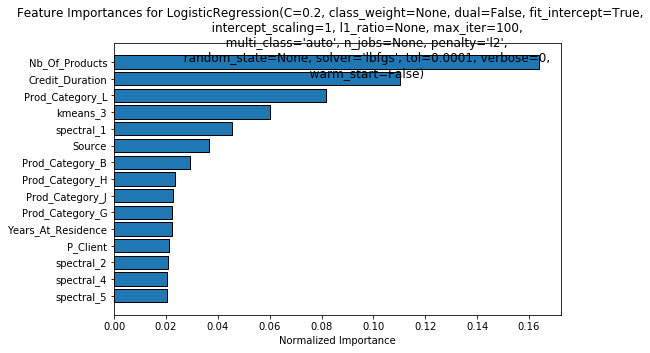


Final Accuracy:  78.76106194690266 %
Final Precision:  69.17562724014337 %
Final Recall:  55.61959654178674 %
Final F1-Score:  61.66134185303515 %


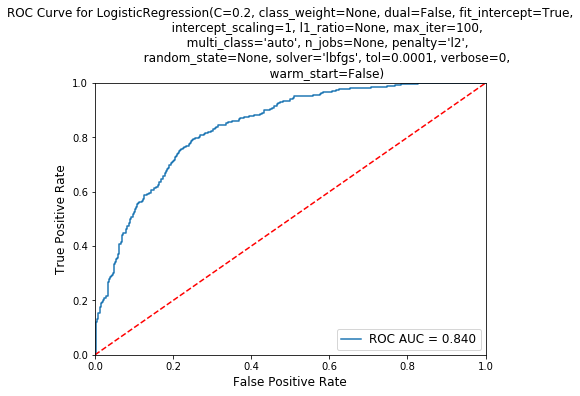

In [82]:
y_test, y_pred_proba = k_fold_test(log_reg, df_normalized,20)

Maximum Accuracy Score : 0.7876106194690266 for threshold at : 0.5
Maximum f1 Score : 0.6726342710997442 for threshold at : 0.34


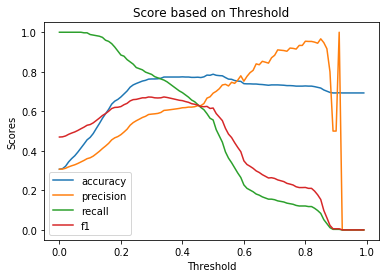

In [83]:
trace_score_threshold(y_test,y_pred_proba)

Testing with only the **4 most important features**:

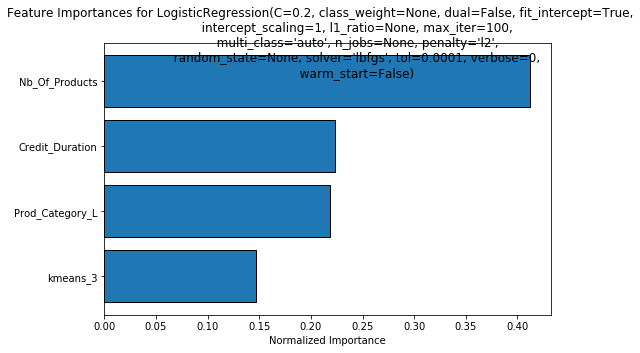


Final Accuracy:  79.11504424778761 %
Final Precision:  72.8395061728395 %
Final Recall:  51.008645533141205 %
Final F1-Score:  60.0 %


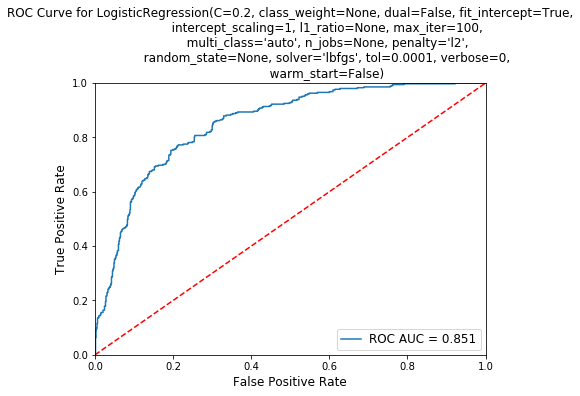

In [85]:
# If you have an error, you shall write the most important features as above
y_test, y_pred_proba = k_fold_test(log_reg, df_normalized[['Y', 'Credit_Duration', 'Prod_Category_L', 'kmeans_3', 'Nb_Of_Products']],20)

Maximum Accuracy Score : 0.804424778761062 for threshold at : 0.48
Maximum f1 Score : 0.6837387964148527 for threshold at : 0.43


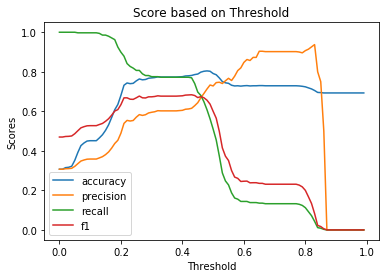

In [86]:
trace_score_threshold(y_test,y_pred_proba)

#### 3.1.2. 20-Fold Cross Validation on Dataset with Polynomial Features

Testing on polynomial dataset:

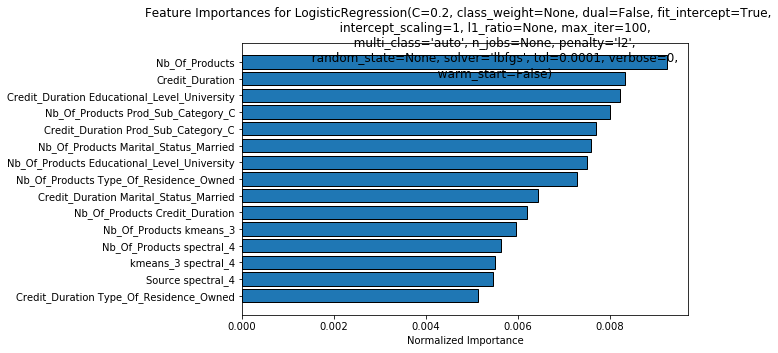


Final Accuracy:  78.93805309734513 %
Final Precision:  68.35016835016835 %
Final Recall:  58.501440922190206 %
Final F1-Score:  63.04347826086957 %


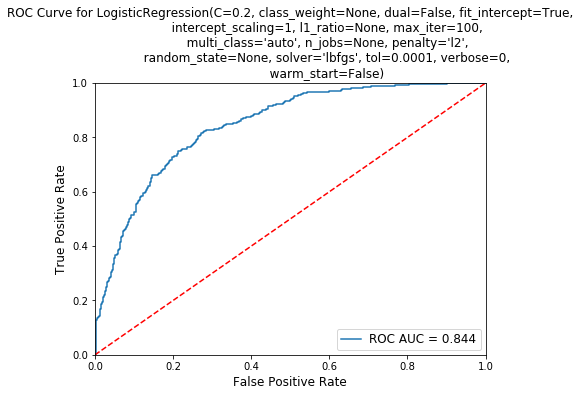

In [87]:
y_test, y_pred_proba = k_fold_test(log_reg, poly_features_normalized, 20)

Maximum Accuracy Score : 0.7946902654867256 for threshold at : 0.46
Maximum f1 Score : 0.67141162514828 for threshold at : 0.29


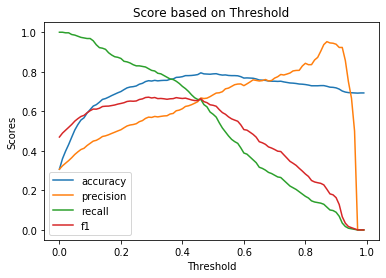

In [88]:
trace_score_threshold(y_test,y_pred_proba)

## 3.2. Random Forests

In [89]:
random_forest = RandomForestClassifier(n_estimators=100, random_state=50, n_jobs=-1)

#### 3.2.1. 20-Fold Cross Validation on Original Dataset

Testing on original dataset:

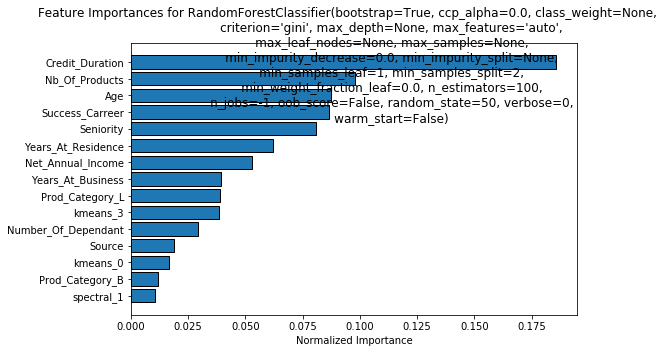


Final Accuracy:  80.35398230088495 %
Final Precision:  71.47766323024055 %
Final Recall:  59.94236311239193 %
Final F1-Score:  65.20376175548589 %


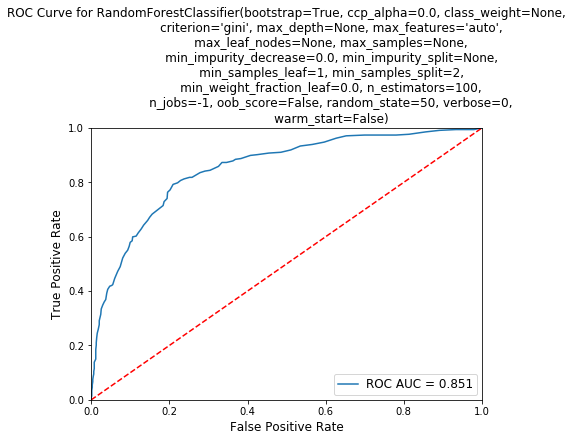

In [90]:
y_test, y_pred_proba = k_fold_test(random_forest, df_normalized, 20)

Maximum Accuracy Score : 0.8035398230088495 for threshold at : 0.5
Maximum f1 Score : 0.6997455470737914 for threshold at : 0.34


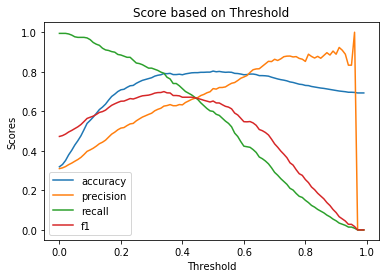

In [91]:
trace_score_threshold(y_test,y_pred_proba)

Testing with only the **4 most important features**:

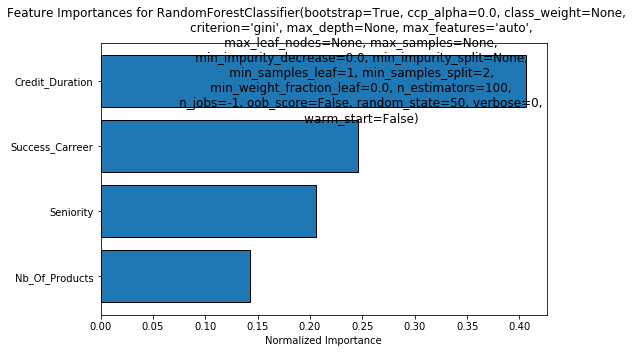


Final Accuracy:  77.61061946902656 %
Final Precision:  65.16129032258064 %
Final Recall:  58.21325648414985 %
Final F1-Score:  61.49162861491628 %


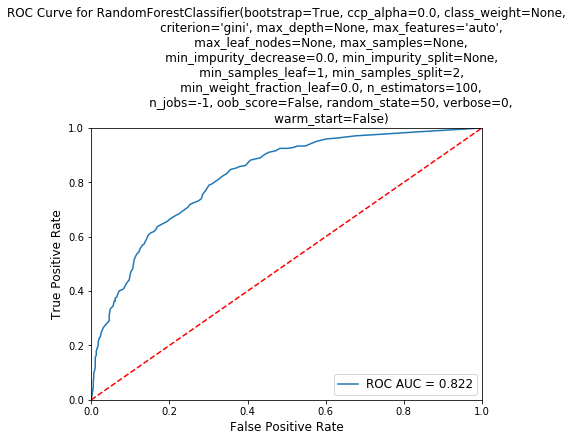

In [92]:
# If you have an error, you shall write the most important features as above
y_test, y_pred_proba = k_fold_test(random_forest, df_normalized[['Y', 'Credit_Duration', 'Seniority', 'Success_Carreer', 'Nb_Of_Products']],20)

Maximum Accuracy Score : 0.7778761061946903 for threshold at : 0.48
Maximum f1 Score : 0.6394399066511085 for threshold at : 0.27


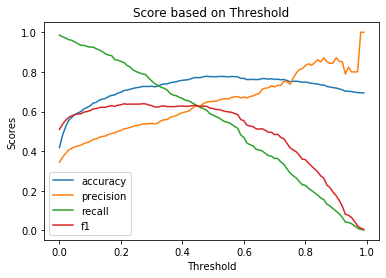

In [93]:
trace_score_threshold(y_test,y_pred_proba)

#### 3.2.2. 20-Fold Cross Validation on Dataset with Polynomial Features

Testing on polynomial dataset:

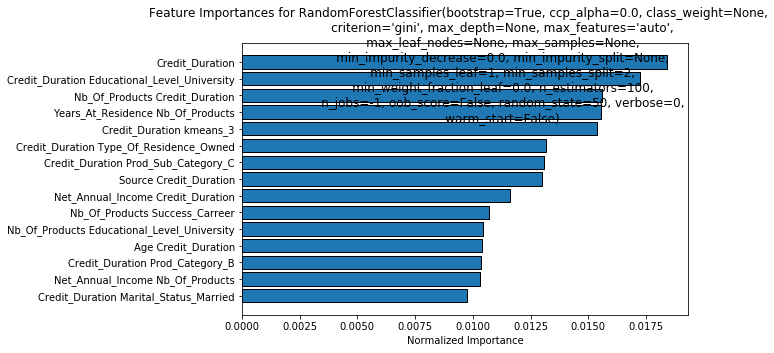


Final Accuracy:  79.73451327433628 %
Final Precision:  68.67088607594937 %
Final Recall:  62.53602305475504 %
Final F1-Score:  65.46003016591251 %


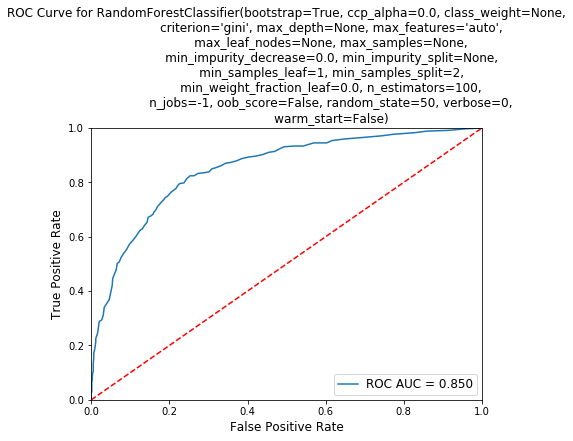

In [94]:
y_test, y_pred_proba = k_fold_test(random_forest, poly_features_normalized,20)

Maximum Accuracy Score : 0.8008849557522124 for threshold at : 0.55
Maximum f1 Score : 0.69 for threshold at : 0.33


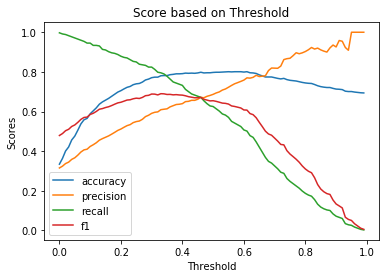

In [95]:
trace_score_threshold(y_test,y_pred_proba)

## 2.3. Light Gradient Boost

In [96]:
lgb_model = lgb.LGBMClassifier(n_estimators=10000, objective = 'binary', 
                                   class_weight = 'balanced', learning_rate = 0.05, 
                                   reg_alpha = 0.1, reg_lambda = 0.1, 
                                   subsample = 0.8, n_jobs = -1, random_state = 50)

#### 2.3.1. 20-Fold Cross Validation on Original Dataset

Testing on original dataset:

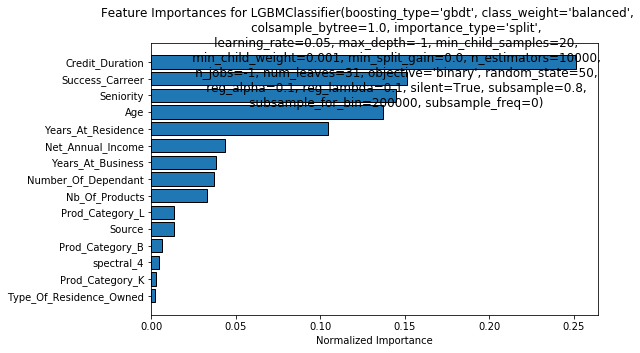


Final Accuracy:  78.31858407079646 %
Final Precision:  64.73988439306359 %
Final Recall:  64.55331412103746 %
Final F1-Score:  64.64646464646465 %


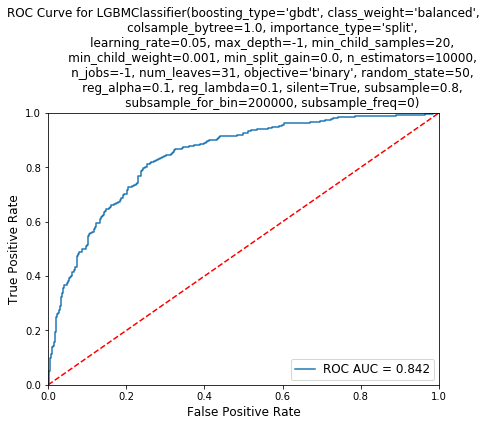

In [97]:
y_test, y_pred_proba = k_fold_test(lgb_model, df_normalized,20)

Maximum Accuracy Score : 0.7911504424778761 for threshold at : 0.79
Maximum f1 Score : 0.6795180722891566 for threshold at : 0.11


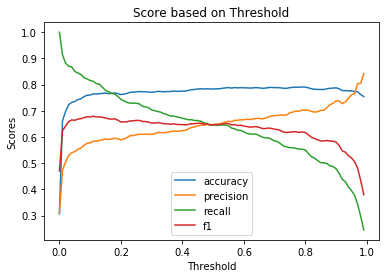

In [98]:
trace_score_threshold(y_test,y_pred_proba)

Testing with only the **4 most important features**:

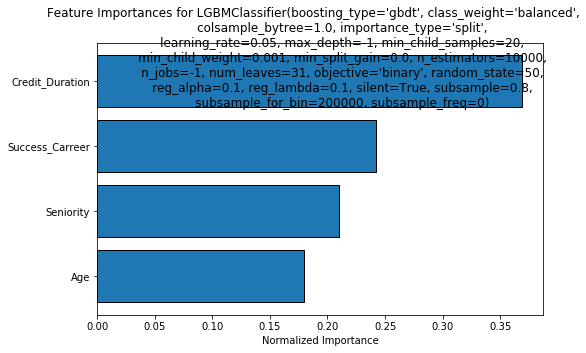


Final Accuracy:  67.69911504424779 %
Final Precision:  47.383720930232556 %
Final Recall:  46.97406340057637 %
Final F1-Score:  47.178002894356005 %


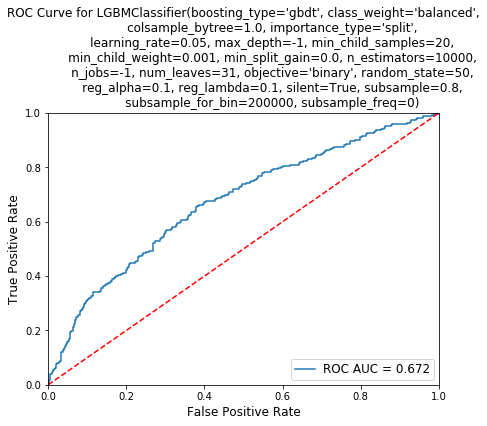

In [99]:
# If you have an error, you shall write the most important features as above
y_test, y_pred_proba = k_fold_test(lgb_model, df_normalized[['Y', 'Credit_Duration', 'Seniority', 'Success_Carreer', 'Age']],20)

Maximum Accuracy Score : 0.7194690265486726 for threshold at : 0.93
Maximum f1 Score : 0.5212527964205816 for threshold at : 0.08


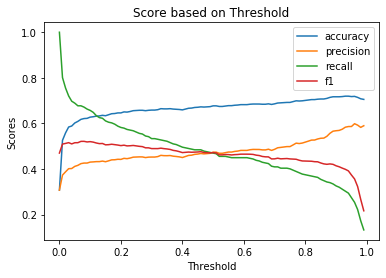

In [100]:
trace_score_threshold(y_test,y_pred_proba)

#### 2.3.2. 20-Fold Cross Validation on Dataset with Polynomial Features

Testing on polynomial dataset:

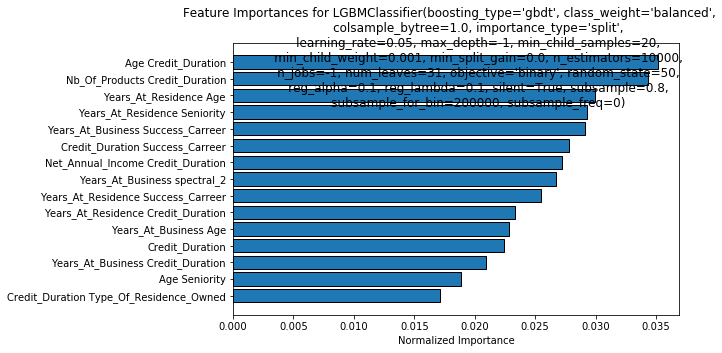


Final Accuracy:  79.02654867256638 %
Final Precision:  65.625 %
Final Recall:  66.57060518731988 %
Final F1-Score:  66.09442060085837 %


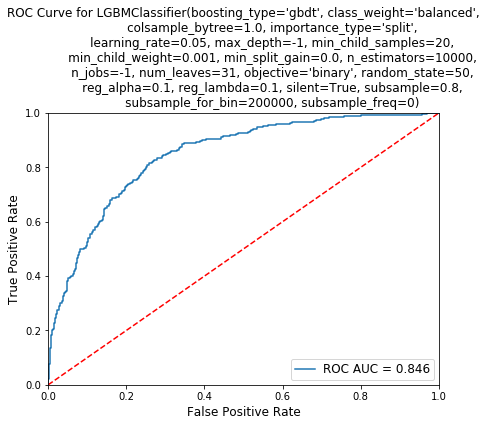

In [101]:
y_test, y_pred_proba = y_test, y_pred_proba = k_fold_test(lgb_model, poly_features_normalized,20)

Maximum Accuracy Score : 0.7929203539823009 for threshold at : 0.55
Maximum f1 Score : 0.6794717887154861 for threshold at : 0.09


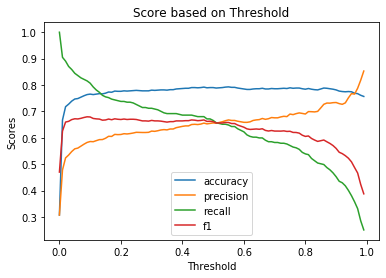

In [102]:
trace_score_threshold(y_test,y_pred_proba)

   ## 2.4. XGBoost

In [103]:
ratio = (df['Y'] == 0).sum()/ (df['Y'] == 1).sum()
xgb_model = xgb.XGBClassifier(n_estimators=1000, objective='binary:logistic', 
                              gamma=0.1, subsample=0.5, scale_pos_weight=ratio)

In [104]:
# # To choose the best tree limit

# xgb_model.fit(x_train, y_train, eval_set=[(x_test, y_test)], eval_metric='auc', early_stopping_rounds=10)
# n_estimators = clf.best_ntree_limit


# # To run xgb estimator with the best tree limit

# xgb_model = XGBClassifier(n_estimators=n_estimators, objective='binary:logistic', 
#                     gamma=0.1, subsample=0.5, scale_pos_weight=ratio)
# xgb_model.fit(df_train.values, y_train.values, 
#         eval_set=[(df_train.values, y_train.values)], eval_metric='auc')

#### 2.4.1. 20-Fold Cross Validation on Original Dataset

Testing on original dataset:

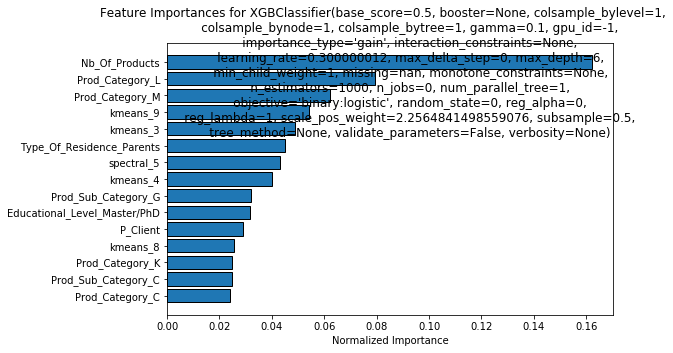


Final Accuracy:  77.34513274336283 %
Final Precision:  63.112391930835734 %
Final Recall:  63.112391930835734 %
Final F1-Score:  63.112391930835734 %


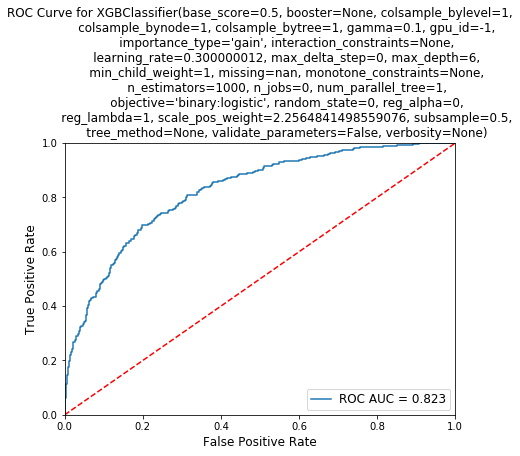

In [105]:
y_test, y_pred_proba = k_fold_test(xgb_model, df_normalized,20)

Maximum Accuracy Score : 0.7805309734513274 for threshold at : 0.73
Maximum f1 Score : 0.6487935656836461 for threshold at : 0.3


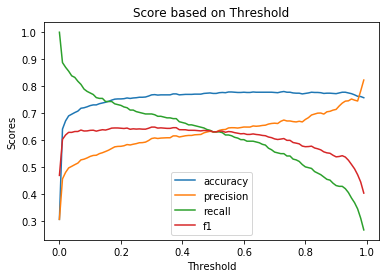

In [106]:
trace_score_threshold(y_test,y_pred_proba)

Testing with only the **4 most important features**:

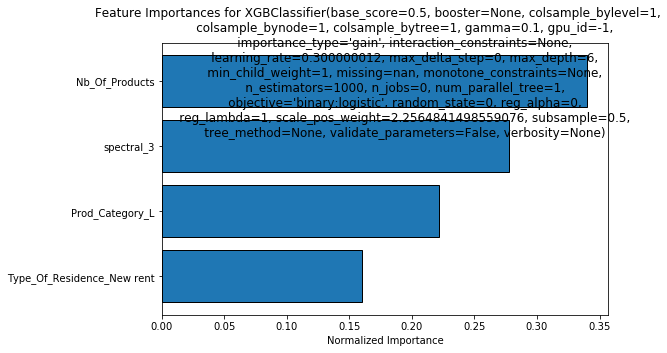


Final Accuracy:  56.90265486725664 %
Final Precision:  41.358024691358025 %
Final Recall:  96.54178674351584 %
Final F1-Score:  57.908383751080386 %


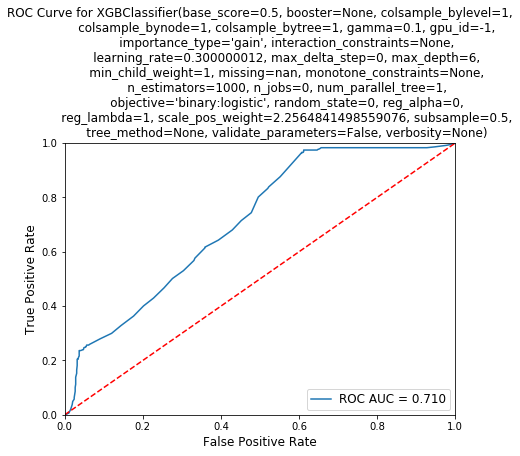

In [107]:
# If you have an error, you shall write the most important features as above
y_test, y_pred_proba = k_fold_test(xgb_model, df_normalized[['Y', 'Nb_Of_Products', 'Prod_Category_L','spectral_3','Type_Of_Residence_New rent']],20)

Maximum Accuracy Score : 0.7398230088495575 for threshold at : 0.63
Maximum f1 Score : 0.5807560137457044 for threshold at : 0.16


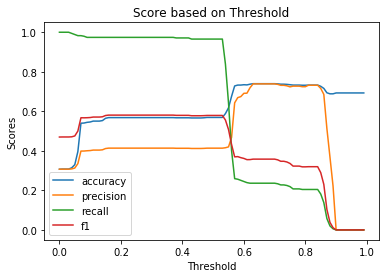

In [108]:
trace_score_threshold(y_test,y_pred_proba)

#### 2.4.2. 20-Fold Cross Validation on Dataset with Polynomial Features

Testing on polynomial dataset:

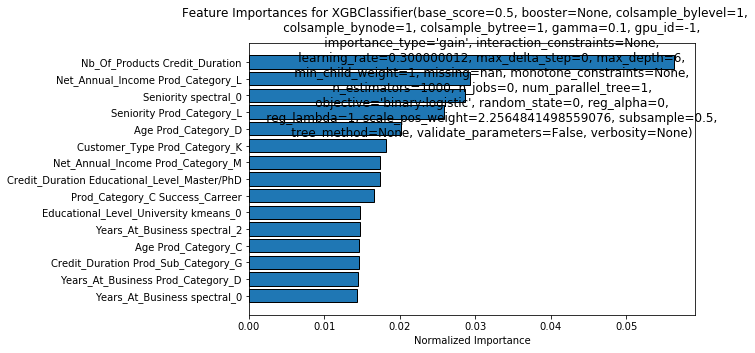


Final Accuracy:  77.78761061946902 %
Final Precision:  64.03508771929825 %
Final Recall:  63.112391930835734 %
Final F1-Score:  63.57039187227866 %


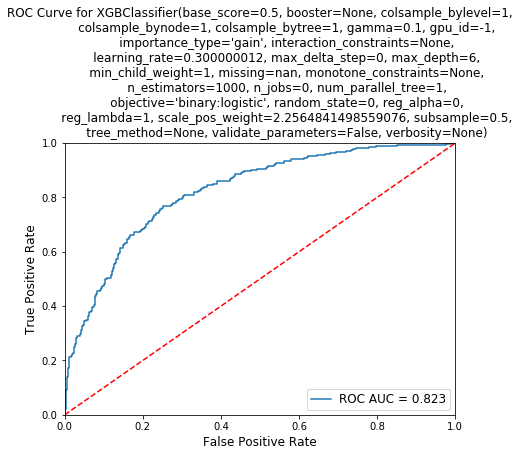

In [109]:
y_test, y_pred_proba = k_fold_test(xgb_model, poly_features_normalized,20)

Maximum Accuracy Score : 0.7814159292035399 for threshold at : 0.58
Maximum f1 Score : 0.655980271270037 for threshold at : 0.14


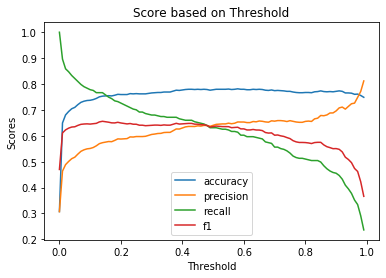

In [110]:
trace_score_threshold(y_test,y_pred_proba)

   ## 2.5. Support Vector Machine

No feature importance for SVM.

In [111]:
# SVM with a RBF kernel, default gamma and cost
svc = SVC(probability = True, gamma = 'scale')

#### 2.5.1. 20-Fold Cross Validation on Original Dataset

Testing on original dataset:


Final Accuracy:  76.72566371681417 %
Final Precision:  64.1891891891892 %
Final Recall:  54.7550432276657 %
Final F1-Score:  59.09797822706064 %


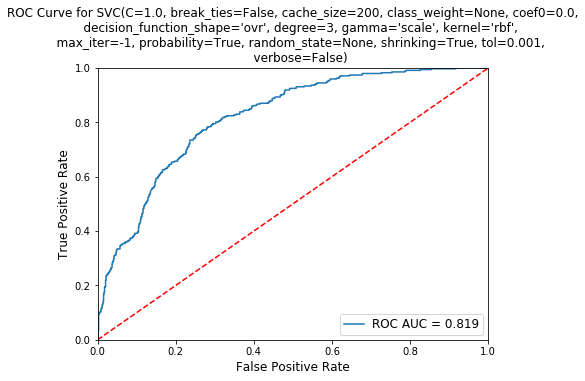

In [112]:
y_test, y_pred_proba = k_fold_test(svc, df_normalized, 20, False)

Maximum Accuracy Score : 0.7707964601769911 for threshold at : 0.45
Maximum f1 Score : 0.6473429951690821 for threshold at : 0.24


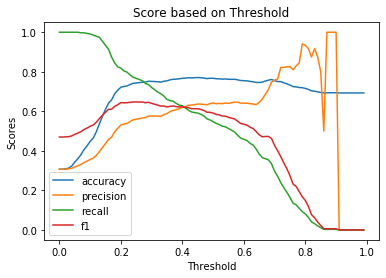

In [113]:
trace_score_threshold(y_test,y_pred_proba)

#### 2.5.2. 20-Fold Cross Validation on Dataset with Polynomial Features

Testing on polynomial dataset:


Final Accuracy:  76.28318584070797 %
Final Precision:  63.57388316151202 %
Final Recall:  53.31412103746398 %
Final F1-Score:  57.993730407523515 %


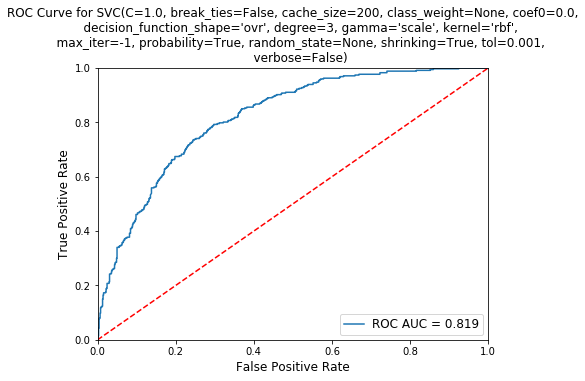

In [114]:
y_test, y_pred_proba = k_fold_test(svc, poly_features_normalized,20, False)

Maximum Accuracy Score : 0.768141592920354 for threshold at : 0.48
Maximum f1 Score : 0.6416040100250626 for threshold at : 0.26


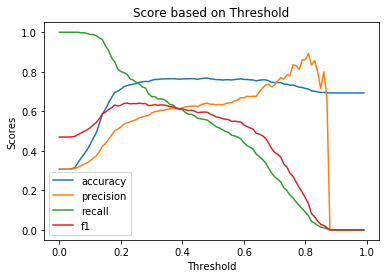

In [115]:
trace_score_threshold(y_test,y_pred_proba)

## 2.6. Neural Network

In [116]:
# To print Ax plots
init_notebook_plotting()

[INFO 04-17 19:15:03] ipy_plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


In [117]:
# Preparing training/testing data

x = df.drop(columns="Y")
y = df['Y']
# Normalize data
scaler.fit(x)
x = scaler.transform(x)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
# Formatting data
x_train = torch.tensor(np.array(x_train, dtype=np.float32))
x_test = torch.tensor(np.array(x_test, dtype=np.float32))
y_train = torch.tensor(np.array(y_train)).reshape(-1,1)
y_test = torch.tensor(np.array(y_test)).reshape(-1,1)
y_train.squeeze_(1)
y_test.squeeze_(1)

train_ds = TensorDataset(x_train, y_train)
test_ds = TensorDataset(x_test, y_test)

n_features = x_train.shape[1]


# Loss function
loss_func = F.cross_entropy

In [118]:
class NN(nn.Module):
    def __init__(self, hidden_size1, hidden_size2):
        super().__init__()
        self.lin1 = nn.Linear(n_features, hidden_size1)
        self.lin2 = nn.Linear(hidden_size1, hidden_size2)
        self.lin3 = nn.Linear(hidden_size2, 2)
        self.relu = nn.ReLU()
        self.sig = nn.Sigmoid()

    def forward(self, xb):
        xb = self.relu(self.lin1(xb))
        xb = self.relu(self.lin2(xb))
        return self.sig(self.lin3(xb))

In [119]:
# Function returning our metrics to be optimized
def train_rnn(parameters):
    batch_size = 32
    nb_of_epochs = 300
    learning_rate, mu = parameters['lr'], parameters['mu']
    train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    test_dl = DataLoader(test_ds, batch_size=batch_size)

    model = NN(25, 15)
    opt = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=mu)
    global_loss, global_accuracy, global_precision, global_recall, global_f1 = 0, 0, 0, 0, 0
    
    for epoch in range(nb_of_epochs):
        model.train()
        for xb, yb in train_dl:
            pred = model(xb)
            loss = loss_func(pred, yb.type(torch.LongTensor))
            loss.backward()
            opt.step()
            opt.zero_grad()

        model.eval()
        with torch.no_grad():
            global_loss += sum(loss_func(model(xb), yb.type(torch.LongTensor)) for xb, yb in test_dl)

        _, preds = torch.max(model(x_test), dim=1)
        global_accuracy += 100 * torch.sum(preds == y_test).item() / len(preds)
        preds_sum, test_sum = torch.sum(preds).item(), torch.sum(y_test).item()
        if preds_sum != 0:
            precision = 100 * torch.sum((preds == y_test) & (y_test == 1)).item() / torch.sum(preds).item()
        else:
            precision = 0
        if test_sum != 0:
            recall = 100 * torch.sum((preds == y_test) & (y_test == 1)).item() / torch.sum(y_test).item()
        else:
            recall = 0
        global_precision += precision
        global_recall += recall
        if precision != 0 and recall != 0:
            global_f1 += 2 / ((1 / precision) + (1 / recall))
    
    global_accuracy /= nb_of_epochs
    global_precision /= nb_of_epochs
    global_recall /= nb_of_epochs
    global_f1 /= nb_of_epochs
    global_loss /= nb_of_epochs
    return {'accuracy': (global_accuracy, 0.0), 'precision': (global_precision, 0.0), 'recall': (global_recall, 0.0),
           'f1': (global_f1, 0.0), 'loss': (global_loss, 0.0)}

Rather than a grid search to find the hyperparameters that give the best F1-score for our model and our data, we chose the **Bayesian optimization** strategy, already implemented in the Ax library; we fine-tuned even more the hyperparameters selection by repeating the process with finer bounds (the bounds you see below are the ones we found at the end of this whole process):

In [120]:
# Tuning NN hyperparameters
# Bounds were tuned after multiple tuning steps
best_parameters, values, experiment, model = optimize(
    parameters=[
        {
            "name": "lr",             # Learning rate
            "type": "range",
            "bounds": [0.1, 0.2],     
            "value_type": "float",
            "log_scale": True
        },
        {
            "name": "mu",             # Momentum
            "type": "range",
            "bounds": [0.89, 0.9],
            "value_type": "float"
        },
#         {
#             "name": "bs",           # Batch-size
#             "type": "range",
#             "bounds": [4, 9]
#         },
#         {
#             "name": "hs",           # Size of hidden layer
#             "type": "range",
#             "bounds": [5, 35],
#         },
#         {
#             "name": "wd",           # Weight Decay
#             "type": "range",
#             "bounds": [0.0, 0.005],
#             "value_type": "float"
#         },
#         {
#             "name": "ne",           # Number of epochs
#             "type": "range",
#             "bounds": [100, 500],
#         }
    ],
    evaluation_function=train_rnn,
    objective_name='f1',
)

[INFO 04-17 19:15:03] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy: GenerationStrategy(name='Sobol+GPEI', steps=[Sobol for 5 trials, GPEI for subsequent trials]). Iterations after 5 will take longer to generate due to  model-fitting.
[INFO 04-17 19:15:03] ax.service.managed_loop: Started full optimization with 20 steps.
[INFO 04-17 19:15:03] ax.service.managed_loop: Running optimization trial 1...
[INFO 04-17 19:15:14] ax.service.managed_loop: Running optimization trial 2...
[INFO 04-17 19:15:25] ax.service.managed_loop: Running optimization trial 3...
[INFO 04-17 19:15:36] ax.service.managed_loop: Running optimization trial 4...
[INFO 04-17 19:15:47] ax.service.managed_loop: Running optimization trial 5...
[INFO 04-17 19:15:58] ax.service.managed_loop: Running optimization trial 6...
[INFO 04-17 19:16:12] ax.service.managed_loop: Running optimization trial 7...
[INFO 04-17 19:16:25] ax.service.managed_loop: Running optimization trial 8...
[INFO 04-17 

In [121]:
# The best parameters according to the Bayesian optimizer
best_parameters

{'lr': 0.14116053072179605, 'mu': 0.8907912730131208}

In [122]:
# Mean F1-Score obtained
means, covariances = values
means

{'accuracy': 77.82153373640638,
 'f1': 61.28508863080903,
 'precision': 70.22427781353724,
 'recall': 55.95495446815053,
 'loss': 4.479239951765335}

We then plot the surfaces computed by the Bayesian optimizer so as to fine-tune even more the bounds - and the overall F1-Score:

In [123]:
render(plot_contour(model=model, param_x='lr', param_y='mu', metric_name='f1'))

The squares represent the parameters tested by the optimizer (the first 5 are tested according to a random-search strategy, while the other ones take into account the previous ones, through a Bayesian optimization strategy, so as to test the parameters that will give more information on the parameters space).

Printing accuracy and F1-Score with the best parameters:

In [124]:
best_objectives = np.array([[trial.objective_mean*100 for trial in experiment.trials.values()]])
best_objective_plot = optimization_trace_single_method(
    y=np.maximum.accumulate(best_objectives, axis=1),
    title="Model performance vs. # of iterations",
    ylabel="Classification F1-score, %",
)
render(best_objective_plot)

## 2.7. Tuning Hyperparameters

We now keep the most promising learning model based on the F1-Score results and Area Under the Curve of each ROC Curve, namely **Random Forests**.

Besides, we won't keep the polynomial features as they don't seem to perform better and present a greater risk of overfitting.

In [125]:
# The function returning the metrics we want to optimize
def tune_rdm_forest(parameters):
    random_forest = RandomForestClassifier(n_estimators=parameters['n_estimators'], max_depth=parameters['max_depth'], 
                                           min_samples_split=parameters['min_samples_split'], min_samples_leaf=parameters['min_samples_leaf'], 
                                           random_state=50, n_jobs=-1)
    y_test, y_pred_proba = k_fold_test(random_forest, df_normalized, 20, Verbose=False)
    y_pred = list(round(pd.Series(y_pred_proba)))
    return({'f1': (f1_score(y_test,y_pred), 0.0)})

In [126]:
# Tuning NN hyperparameters
# Bounds were tuned after multiple tuning steps
best_parameters, values, experiment, model = optimize(
    parameters=[
        {
            "name": "n_estimators",            
            "type": "range",
            "bounds": [625, 630]
        },
        {
            "name": "max_depth",           
            "type": "range",
            "bounds": [78, 83]
        },
        {
            "name": "min_samples_split",        
            "type": "range",
            "bounds": [17, 19]
        },
        {
            "name": "min_samples_leaf",           
            "type": "range",
            "bounds": [1, 2]
        }
    ],
    evaluation_function=tune_rdm_forest,
    objective_name='f1'
)

[INFO 04-17 19:19:35] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy: GenerationStrategy(name='Sobol+GPEI', steps=[Sobol for 5 trials, GPEI for subsequent trials]). Iterations after 5 will take longer to generate due to  model-fitting.
[INFO 04-17 19:19:35] ax.service.managed_loop: Started full optimization with 20 steps.
[INFO 04-17 19:19:35] ax.service.managed_loop: Running optimization trial 1...
[INFO 04-17 19:19:57] ax.service.managed_loop: Running optimization trial 2...
[INFO 04-17 19:20:19] ax.service.managed_loop: Running optimization trial 3...
[INFO 04-17 19:20:42] ax.service.managed_loop: Running optimization trial 4...
[INFO 04-17 19:21:05] ax.service.managed_loop: Running optimization trial 5...
[INFO 04-17 19:21:27] ax.service.managed_loop: Running optimization trial 6...
[INFO 04-17 19:21:51] ax.service.managed_loop: Running optimization trial 7...
[INFO 04-17 19:22:14] ax.service.managed_loop: Running optimization trial 8...
[INFO 04-17 

In [127]:
# The best parameters according to the Bayesian optimizer
best_parameters

{'n_estimators': 629,
 'max_depth': 80,
 'min_samples_split': 19,
 'min_samples_leaf': 2}

In [128]:
# Mean F1-Score obtained
means, covariances = values
means

{'f1': 0.6489028216541322}

We then plot the surfaces computed by the Bayesian optimizer so as to fine-tune even more the bounds - and the overall F1-Score:

In [129]:
params = ['n_estimators', 'max_depth', 'min_samples_split', 'min_samples_leaf']

for param in params:
    print('Contours for:', param)
    for other_param in params:
        if not param in other_param:
            render(plot_contour(model=model, param_x=param, param_y=other_param, metric_name='f1'))
    print('')

[ERROR 04-17 19:37:04] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


Contours for: n_estimators


[ERROR 04-17 19:37:04] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 04-17 19:37:05] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 04-17 19:37:06] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.



Contours for: max_depth


[ERROR 04-17 19:37:07] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 04-17 19:37:08] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 04-17 19:37:09] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.



Contours for: min_samples_split


[ERROR 04-17 19:37:10] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 04-17 19:37:11] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 04-17 19:37:12] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.



Contours for: min_samples_leaf


[ERROR 04-17 19:37:13] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 04-17 19:37:13] PlotHelper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


Printing accuracy and F1-Score with the best parameters:

Maximum Accuracy Score : 0.8141592920353983 for threshold at : 0.42
Maximum f1 Score : 0.7004103967168263 for threshold at : 0.38


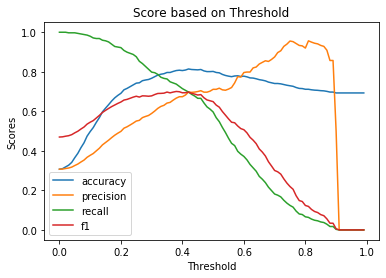

In [130]:
random_forest = RandomForestClassifier(n_estimators=best_parameters['n_estimators'], max_depth=best_parameters['max_depth'], 
                                           min_samples_split=best_parameters['min_samples_split'], min_samples_leaf=best_parameters['min_samples_leaf'], 
                                           random_state=50, n_jobs=-1)
y_test, y_pred_proba = k_fold_test(random_forest, df_normalized, 20, Verbose=False)
trace_score_threshold(y_test,y_pred_proba)

# 4. Results & Conclusion

Now that we have cleaned, explored, analyzed, enriched the dataset, and worked thoroughly on our model to get the best performances (scores, consistency, variance...), we can finally present our results.

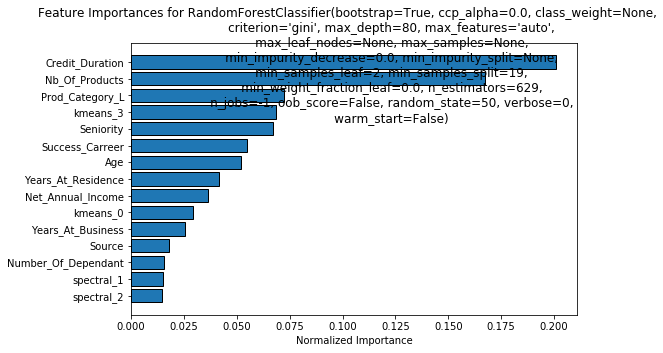


Final Accuracy:  80.17699115044248 %
Final Precision:  71.1340206185567 %
Final Recall:  59.654178674351584 %
Final F1-Score:  64.89028213166144 %


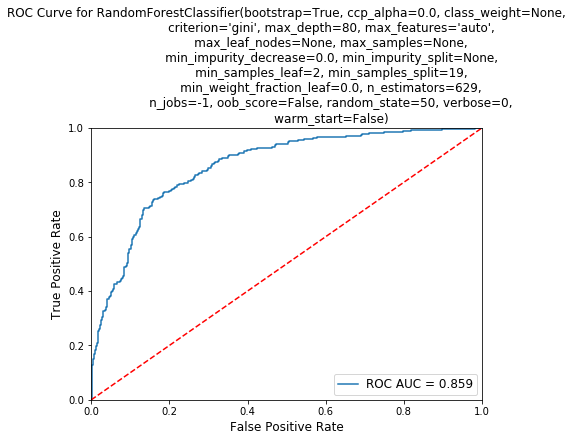

Maximum Accuracy Score : 0.8141592920353983 for threshold at : 0.42
Maximum f1 Score : 0.7004103967168263 for threshold at : 0.38


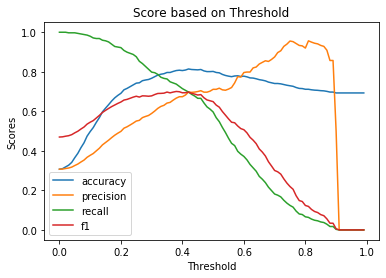

In [134]:
# Random Forest with the best parameters
random_forest_tuned = RandomForestClassifier(n_estimators=629, max_depth=80, 
                                           min_samples_split=19, min_samples_leaf=2, 
                                           random_state=50, n_jobs=-1)
y_test, y_pred_proba = k_fold_test(random_forest, df_normalized, 20)
trace_score_threshold(y_test,y_pred_proba)

With only the **5 most important features** to prevent from overfitting:

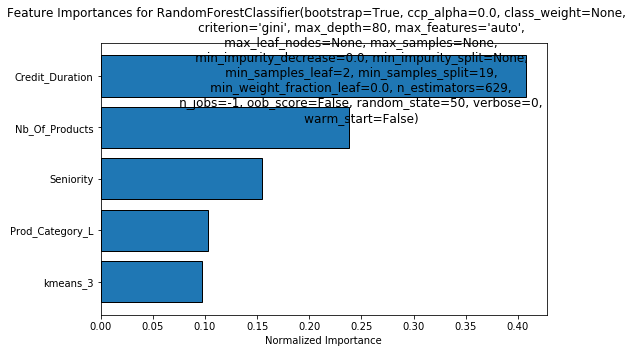


Final Accuracy:  81.59292035398231 %
Final Precision:  72.78688524590164 %
Final Recall:  63.976945244956774 %
Final F1-Score:  68.09815950920246 %


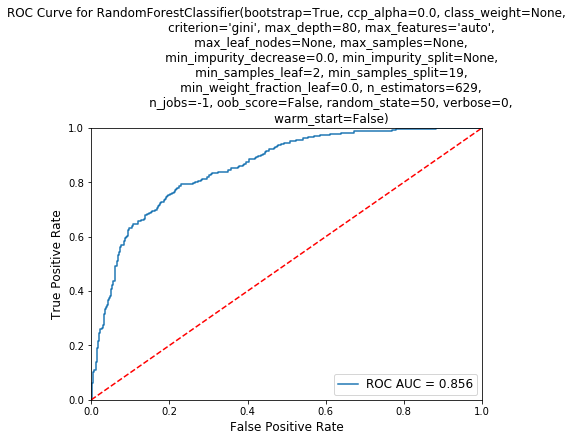

Maximum Accuracy Score : 0.8194690265486726 for threshold at : 0.52
Maximum f1 Score : 0.6851851851851852 for threshold at : 0.36


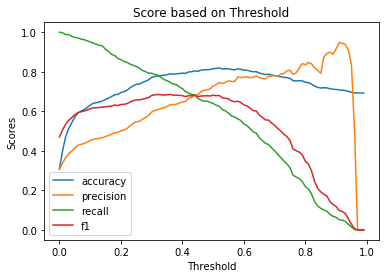

In [137]:
# Random Forest with the best parameters and the 5 most important features
# If you have an error, you shall write the most important features as above
y_test, y_pred_proba = k_fold_test(random_forest_tuned, df_normalized[['Y', 'Credit_Duration', 'Nb_Of_Products', 
                                                                       'Prod_Category_L', 'kmeans_3', 'Seniority']], 20)
trace_score_threshold(y_test,y_pred_proba)

Surprisingly, we obtained a better accuracy (81.9%) with only 5 features than with the whole dataset (81.4%)!
However, the F1-Score decreases with the number of features (68.5% // 70.0%).

**NB** : The results we get cannot be compared with results from other notebooks on this problem because we've made assumptions and interpreted the challenge, which led us to work on a very specific dataset. Therefore it's hard for us to judge the **absolute performance** of our model.

To make our model compatible with the initial dataset, we could have tauhght it to return Y = 0 if the feature *Prod_Closed_Date* was empty. By a simple calculus, we get an accuracy on the overall dataset of :

In [138]:
((4206 - 33) + 0.81 * 1130) / (4206+1130)

0.9535794602698651

We really enjoyed working on this notebook as it challenged us on many levels and helped us growing new skills!

Thank you for reading.

# END OF THE NOTEBOOK